**Whatsapp_Chat_Analysis Part:**





Required Libraries:

In [ ]:
!pip install gradio
!pip install regex
!pip install emoji
!pip install plotly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.7/56.7 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.8/319.8 kB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.7/94.7 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.5/447.5 kB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 64.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.3/73.3 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 9.3 MB/s eta 0:00:00
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2
  Attempting uninstall: huggingface-hub
    Found existing installation: huggingface-hub 0.24.7
    Uninstalling huggingface-hub-0.24.7:
      Successfully uninstalled huggingface-hub-0.24.7
   ━━━━

In [ ]:
import re
import regex
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import emoji
import plotly.express as px
import gradio as gr

from textblob import TextBlob

Validates date and time format:

In [ ]:
def date_time(s):
    pattern = '^([0-9]+)(\/)([0-9]+)(\/)([0-9]+), ([0-9]+):([0-9]+)[ ]?(AM|PM|am|pm)? -'
    result = regex.match(pattern, s)
    if result:
        return True
    return False
# Checks for author presence
def find_author(s):
    s = s.split(":")
    if len(s)==2:
        return True
    else:
        return False
   # Extracts date, time, author, and message.
def getDatapoint(line):
    splitline = line.split(' - ')
    dateTime = splitline[0]
    date, time = dateTime.split(", ")
    message = " ".join(splitline[1:])
    if find_author(message):
        splitmessage = message.split(": ")
        author = splitmessage[0]
        message = " ".join(splitmessage[1:])
    else:
        author= None
    return date, time, author, message

Extracts and organizes chat messages from a file into a structured format:

In [ ]:
data = []
conversation = '/content/Whatsapp_chat.txt'
with open(conversation, encoding="utf-8") as fp:
    fp.readline()
    messageBuffer = []
    date, time, author = None, None, None
    while True:
        line = fp.readline()
        if not line:
            break
        line = line.strip()
        if date_time(line):
            if len(messageBuffer) > 0:
                data.append([date, time, author, ' '.join(messageBuffer)])
            messageBuffer.clear()
            date, time, author, message = getDatapoint(line)
            messageBuffer.append(message)
        else:
            messageBuffer.append(line)

Creates a DataFrame from chat data, converts dates, and displays summary information:

In [ ]:
df = pd.DataFrame(data, columns=["Date", 'Time', 'Author', 'Message'])
df['Date'] = pd.to_datetime(df['Date'])
print(df.tail(20))
print(df.info())
print(df.Author.unique())

            Date     Time                          Author  \
13633 2020-10-02  1:27 am                 +91 73032 50500   
13634 2020-10-02  1:46 am       Darshan Rander (TSEC, IT)   
13635 2020-10-02  1:47 am                 +91 73032 50500   
13636 2020-10-02  1:47 am                 +91 73032 50500   
13637 2020-10-02  1:47 am                 +91 73032 50500   
13638 2020-10-02  1:47 am                 +91 73032 50500   
13639 2020-10-02  1:47 am                 +91 73032 50500   
13640 2020-10-02  1:47 am       Darshan Rander (TSEC, IT)   
13641 2020-10-02  1:49 am  Shubham Chettiar (TSEC CS, TE)   
13642 2020-10-02  1:49 am       Darshan Rander (TSEC, IT)   
13643 2020-10-02  1:50 am  Shubham Chettiar (TSEC CS, TE)   
13644 2020-10-02  1:52 am         Tanay Kamath (TSEC, CS)   
13645 2020-10-02  1:56 am       Darshan Rander (TSEC, IT)   
13646 2020-10-02  1:58 am         Tanay Kamath (TSEC, CS)   
13647 2020-10-02  1:58 am         Tanay Kamath (TSEC, CS)   
13648 2020-10-02  2:05 a

<ipython-input-7-66e13cebf647>:2: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df['Date'] = pd.to_datetime(df['Date'])


Counts and prints the total number of messages in the DataFrame:

In [ ]:
total_messages = df.shape[0]
print(total_messages)

13653


Counts and prints the number of media messages in the DataFrame:

In [ ]:
media_messages = df[df["Message"]=='<Media omitted>'].shape[0]
print(media_messages)

687


Counts and summarizes total messages, media shared, and links in the chat data:

In [ ]:
URLPATTERN = r'(https?://\S+)'
df['urlcount'] = df.Message.apply(lambda x: regex.findall(URLPATTERN, x)).str.len()
links = np.sum(df.urlcount)

print("Chats between all members")
print("Total Messages: ", total_messages)
print("Number of Media Shared: ", media_messages)
print("Number of Links Shared", links)

Chats between all members
Total Messages:  13653
Number of Media Shared:  687
Number of Links Shared 766


Analyzes WhatsApp chat data by calculating message statistics, filtering out media messages, and summarizing user activity, including message counts, average words, emojis, and links sent:

In [ ]:
# Read the data from a text file
file_path = '/content/Whatsapp_chat.txt'

# Load the data into a DataFrame
data = []
with open(file_path, 'r') as file:
    for line in file:
        parts = line.strip().split(': ', 1)  # Split into Author and Message
        if len(parts) == 2:
            author, message = parts
            data.append({'Author': author, 'Message': message})

df = pd.DataFrame(data)

# Filtering out media messages
media_messages_df = df[df['Message'] == '<Media omitted>']
messages_df = df.drop(media_messages_df.index)

# Calculating letter and word counts
messages_df['Letter_Count'] = messages_df['Message'].apply(len)
messages_df['Word_Count'] = messages_df['Message'].apply(lambda s: len(s.split()))
messages_df['MessageCount'] = 1

# Users list (You can modify this as needed)
users = messages_df['Author'].unique()  # Get unique users from the DataFrame

# Analyzing messages for each user
for user in users:
    # Filtering messages for the specific user
    req_df = messages_df[messages_df['Author'] == user]

    # Displaying stats for the user
    print(f'Stats of {user} -')
    print('Messages Sent:', req_df.shape[0])

    if req_df.shape[0] > 0:  # Avoid division by zero
        words_per_message = np.sum(req_df['Word_Count']) / req_df.shape[0]
        print('Average Words per message:', words_per_message)
    else:
        print('Average Words per message: 0')

    # Counting media messages
    media_count = media_messages_df[media_messages_df['Author'] == user].shape[0]
    print('Media Messages Sent:', media_count)

    # Counting emojis and links (assuming emojis and URLs are counted elsewhere)
    req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
    req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex

    emojis = req_df['emoji'].sum()
    print('Emojis Sent:', emojis)

    links = req_df['urlcount'].sum()
    print('Links Sent:', links)

    print('---')  # Separator for clarity


Stats of 27/01/2020, 7:31 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 7:31 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 7:32 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 7:32 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 7:43 pm - +91 99201 75875 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 7:43 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 7:44 pm - Dheeraj Lalwani (T

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 10:04 pm - +91 77568 95072 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 10:04 pm - Rohit Pathak (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 10:05 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 10:05 pm - Rohit Pathak (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 10:09 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 10:09 pm - Rohit Pathak (TSEC, CS) -
Messages Sent: 1
Average Word

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 11:00 pm - +91 79774 68083 -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 11:05 pm - +91 70394 60876 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 11:06 pm - +91 79774 68083 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 11:06 pm - +91 70394 60876 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 11:07 pm - +91 79774 68083 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 11:07 pm - +91 70394 60876 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/01/2020, 11:23 pm - +91 96191 5

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 28/01/2020, 7:08 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/01/2020, 7:09 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/01/2020, 7:10 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/01/2020, 7:10 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/01/2020, 7:10 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/01/2020, 7:11 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/01/2020, 7:11 pm - Dheeraj Lalwani (TSEC, CS) -
Message

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 28/01/2020, 7:30 pm - +91 99201 75875 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/01/2020, 7:31 pm - Chirag Sharma (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/01/2020, 7:39 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/01/2020, 7:41 pm - Chirag Sharma (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 28/01/2020, 7:47 pm - Saket (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/01/2020, 7:48 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/01/2020, 7:49 pm 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 29/01/2020, 7:50 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 7:51 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 7:51 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 7:58 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 8:04 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 21.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 8:11 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 8:12 pm - +91

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 29/01/2020, 8:41 pm - +91 96191 55044 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 8:57 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 8:58 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 9:22 pm - +91 96191 55044 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 9:43 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 25.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 9:50 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 9:55 pm - +91 79770 56210 -
Messages Sent: 1

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Average Words per message: 18.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 10:53 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 10:54 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 10:54 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 10:54 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 29/01/2020, 10:54 pm - Ankit (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 10:55 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Links Sent: 0
---
Stats of 29/01/2020, 11:45 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 5
Average Words per message: 3.8
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 11:45 pm - +91 99201 75875 -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 11:46 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 11:46 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 11:48 pm - +91 99201 75875 -
Messages Sent: 1
Average Words per message: 46.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/01/2020, 11:49 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/01/2020, 9:29 am - +9

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 31/01/2020, 9:20 am - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 31/01/2020, 9:21 am - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 31/01/2020, 10:18 am - +91 89764 07509 -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 31/01/2020, 1:56 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 31/01/2020, 1:57 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/02/2020, 9:48 am - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 20.0
Media Messa

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 01/02/2020, 12:42 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/02/2020, 12:44 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/02/2020, 12:46 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/02/2020, 12:47 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/02/2020, 12:48 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/02/2020, 1:05 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 19.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 01/02/2020, 1:06 pm - +91 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 04/02/2020, 8:18 pm - Vivek (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/02/2020, 8:24 pm - Hardik Raheja (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/02/2020, 8:25 pm - +91 89764 07509 -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 04/02/2020, 8:26 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/02/2020, 8:30 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/02/2020, 8:41 pm - +91 78758 66747 -
Messages Sent: 1
Average Words per message: 24.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/02/2020, 8:47 pm - +91 96191 55044 -
Messages Sent: 2
Ave

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/02/2020, 10:15 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/02/2020, 10:16 pm - Chirag Sharma (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/02/2020, 10:16 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/02/2020, 10:17 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/02/2020, 11:34 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/02/2020, 11:38 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/02/2020, 10:06 pm - Chirag Sharma (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/02/2020, 10:07 pm - Chirag Sharma (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/02/2020, 10:10 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/02/2020, 10:13 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 5
Average Words per message: 4.6
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/02/2020, 10:13 pm - Chirag Sharma (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 1
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/02/2020, 10:14 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Stats of 08/02/2020, 10:39 pm - Mittul Dasani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 2
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/02/2020, 10:40 pm - Mittul Dasani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/02/2020, 10:41 pm - +91 89764 07509 -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/02/2020, 10:42 pm - +91 89764 07509 -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/02/2020, 10:42 pm - Mittul Dasani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/02/2020, 10:44 pm - Mittul Dasani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/02/2020, 10:48 pm - Tanay K

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/02/2020, 3:01 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/02/2020, 3:03 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/02/2020, 3:04 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/02/2020, 3:05 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 4
Average Words per message: 2.75
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/02/2020, 3:06 pm - +91 89764 07509 -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/02/2020, 3:07 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 1
Emojis Sent: 2
Links 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 12/02/2020, 6:26 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/2020, 6:27 pm - Ankit (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/2020, 6:28 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/2020, 6:29 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 6.333333333333333
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/02/2020, 6:29 pm - +91 99201 75875 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/02/2020, 6:31 pm - +91 99676 84479 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 12/02/2020, 7:42 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/2020, 7:43 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/2020, 7:43 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/2020, 8:36 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/2020, 8:38 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/2020, 8:40 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/20

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/02/2020, 8:56 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/2020, 8:57 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/2020, 10:04 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/02/2020, 11:50 pm - +91 70394 60876 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 4
Links Sent: 0
---
Stats of 13/02/2020, 2:55 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 8:15 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 8:26 am - Tanay Kamath (TSEC, CS) -
Mess

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 7:01 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 7:03 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 6.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 7:03 pm - Mohit Varma (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 7:03 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 7:04 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 7:04 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of Link -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 2
---
Stats of 14/02/2020, 7:09 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 7:39 pm - +91 79778 76844 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 7:42 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 7:46 pm - +91 89833 85127 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 7:50 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 7:51 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 8:44 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 8:45 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 8:46 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 14/02/2020, 8:51 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 8:55 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/02/2020, 8:56 pm - Saket (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.5
Medi

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 15/02/2020, 4:08 pm - Chirag Sharma (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/02/2020, 4:16 pm - Chirag Sharma (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/02/2020, 5:17 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/02/2020, 5:53 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/02/2020, 5:56 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of a -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/02/2020, 5:57 pm - +91 89764 07509 -
Messages Sent: 2
Average Words per message: 7.5
Me

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 16/02/2020, 6:04 pm - +91 99675 58551 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/02/2020, 6:10 pm - +91 90822 59476 -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 16/02/2020, 6:11 pm - Vivek Iyer (TSEC, Biomed) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/02/2020, 6:12 pm - Vivek Iyer (TSEC, Biomed) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/02/2020, 6:13 pm - Vivek Iyer (TSEC, Biomed) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/02/2020, 10:29 am - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/02/2020, 10:33 am - Vivek Iyer (TSEC, 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Emojis Sent: 0
Links Sent: 1
---
Stats of 18/02/2020, 7:16 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/02/2020, 10:40 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/02/2020, 10:41 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/02/2020, 11:39 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of printf("Enter input -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/02/2020, 11:43 pm - Tushar Nankani -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/02/2020, 11:44 pm - Tush

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/02/2020, 4:50 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/02/2020, 4:50 pm - Ankit (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/02/2020, 4:51 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/02/2020, 6:56 pm - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/02/2020, 7:01 pm - +91 96992 89993 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/02/2020, 7:10 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 29.0
Media Message

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 9:39 am - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 8:02 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 18.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 8:38 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 8:39 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 8:39 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 8:40 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1
Links Sent: 0
---
Stats of 20/02/2020, 10:16 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:17 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 9.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:17 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 20/02/2020, 10:18 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:19 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:20 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 9.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats o

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Links Sent: 0
---
Stats of 20/02/2020, 10:27 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:28 pm - Ankit (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:28 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:29 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 5
Average Words per message: 1.6
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:29 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:29 pm - +91 99201 75875 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:42 pm - +91 77000 27264 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:42 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:42 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:43 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:43 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:44 pm - +91 77000 27264 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:47 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/02/2020, 10:47 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:47 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:48 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:48 pm - +91 75078 05454 -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:49 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 5
Average Words per message: 5.6
Media Messages Sent: 0
Emojis Sent: 0
L

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:53 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:53 pm - +91 77180 82108 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:54 pm - +91 70394 60876 -
Messages Sent: 3
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:54 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:54 pm - +91 77000 27264 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:54 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 12.0
Media Messa

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 20/02/2020, 10:57 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 10:57 pm - +91 70394 60876 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 20/02/2020, 10:58 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/02/2020, 10:58 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/02/2020, 10:58 pm - Shreya (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:00 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:01 pm - Dheera

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:05 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:05 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:06 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:06 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:06 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:06 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words pe

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 20/02/2020, 11:10 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:11 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:11 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:11 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:12 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:12 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:12 pm - Tanay K

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

1
Average Words per message: 45.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:17 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:18 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:18 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:18 pm - +91 77180 82108 -
Messages Sent: 2
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:18 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:18 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
---
Stats of 20/02/2020, 11:25 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:25 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:28 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:29 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:30 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:30 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:30 pm

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:36 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:36 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 4
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:36 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 4
Average Words per message: 3.75
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/02/2020, 11:36 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:37 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:37 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:43 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 5
Average Words per message: 3.4
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/02/2020, 11:43 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 20/02/2020, 11:43 pm - Shreya (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:43 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:43 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/02/2020, 11:44 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average W

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 21/02/2020, 12:42 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 12:42 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 21/02/2020, 12:43 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 12:44 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 12:46 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 12:47 am - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/20

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 1:33 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 1:34 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 1:35 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 1:44 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 2:01 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 2:20 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 12:18 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.6666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of *Date* -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of *Time* -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of *Registration Fee* -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of *Contest Link* -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of Rushikesh Deshpande -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Tanmay Pardeshi -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 2:43 pm - Ankit (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 2:46 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 3:01 pm - Vivek Iyer (TSEC, Biomed) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 3:53 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 4:00 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 21/02/2020, 4:13 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 5:31 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 5:54 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 21/02/2020, 5:56 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 5:56 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 5:57 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 5:57 pm - Mohit Varma (TSEC, CS) -
Messages Sent: 3
Average Wo

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 🏃🏻‍♀🏃🏻 for more info, *hop on at*  -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 🗓 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 🕗  -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 🏤 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Riya -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Aayushi  -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 9:14 pm - Mittul Dasani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 10:40 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.3333333333333335
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 10:41 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.3333333333333335
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 10:41 pm - +91 70394 60876 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 10:42 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 10:45 pm - Vivek Iyer (TSEC, Biomed) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 10:46 pm - Vivek Iyer (TSEC, Bi

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 21/02/2020, 10:56 pm - +91 83690 21693 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 10:56 pm - Mohammed (TSEC, EXTC) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 10:57 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 11:01 pm - +91 70394 60876 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 11:02 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of SUM  -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 11:05 pm - +91 70394 60876 -
Messages Sent: 1


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 2
Links Sent: 0
---
Stats of 21/02/2020, 11:42 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 11:43 pm - +91 81080 96759 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 11:43 pm - +91 70394 60876 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 11:44 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 21/02/2020, 11:45 pm - +91 81080 96759 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/02/2020, 11:45 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

---
Stats of 22/02/2020, 12:16 am - +91 84529 62233 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 12:20 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 12:39 am - Ankit (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 12:40 am - Ankit (TSEC, CS) -
Messages Sent: 1
Average Words per message: 36.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 12:43 am - +91 99675 58551 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 12:44 am - +91 99675 58551 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 12:44 am - +91 89764 07509 -
Messages

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 22/02/2020, 2:10 am - +91 95949 08570 -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 2:11 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 2:12 am - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 2:13 am - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 2:13 am - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 12:01 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 12:02 pm - Saurav Upoor (T

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 7:56 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 7:57 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 7:58 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 8:01 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 8:01 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 8:06 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
St

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 22/02/2020, 10:18 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 10:39 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 10:40 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 11:01 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 11:04 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 11:17 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 20.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/02/2020, 11:18 pm

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 9:03 am - +91 93243 92133 -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 9:04 am - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 9:06 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 9:08 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 9:19 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 9:27 am - +91 90820 98830 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/202

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 23/02/2020, 10:46 am - +91 93243 92133 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 10:47 am - +91 90820 98830 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 10:47 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 10:54 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 10:55 am - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 10:55 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 10:56 am - +91 7

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 12:03 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 12:07 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 12:08 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 12:09 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 12:11 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 12:12 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 4
Links Sent: 0
---
Stats of 23/02/2020, 12:32 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 3.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 12:32 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 12:33 pm - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 12:33 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 5.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 12:33 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 12:33 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 2:04 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 2:07 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 2:07 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 2:13 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 23/02/2020, 2:14 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 2:17 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words pe

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 23/02/2020, 2:57 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 2:57 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 2:57 pm - +91 98206 01141 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 2:57 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 2:57 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 23/02/2020, 2:58 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 2:58 pm - Dheera

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 23/02/2020, 7:45 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 7:45 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 17.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 7:46 pm - +91 95949 08570 -
Messages Sent: 3
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 7:46 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 7:47 pm - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 7:47 pm - +91 98206 01141 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/02/2020, 7:47 pm - Dheeraj Lalwani (TSEC, CS) -

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 24/02/2020, 4:17 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 4:23 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 4:56 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 4:58 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 4:59 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 3
Average Words per message: 16.666666666666668
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 24/02/2020, 5:00 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Sta

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 24/02/2020, 8:59 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 9:00 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 9:01 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 9:02 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 9:02 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 9:04 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
--

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 10:14 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 10:14 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 24/02/2020, 10:15 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 10:15 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 10:15 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 10:16 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 2
Li

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 10:24 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 10:29 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 10:51 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Round 1  -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Round 2  -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Time  -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Duration  -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 24/02/2020, 10:59 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.3333333333333335
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 11:00 pm - +91 95949 08570 -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 11:10 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/02/2020, 11:18 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/02/2020, 11:06 am - +91 82080 02653 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/02/2020, 11:33 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 25/02/2020, 1:09 pm - +9

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 25/02/2020, 5:52 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/02/2020, 6:04 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 38.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/02/2020, 7:09 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/02/2020, 9:39 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.3333333333333335
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/02/2020, 9:39 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 25/02/2020, 9:40 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 5
Average Words per message: 3.4
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/02/2020, 9

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 26/02/2020, 6:59 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/02/2020, 7:03 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/02/2020, 7:03 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/02/2020, 7:04 pm - +91 88284 70904 -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/02/2020, 7:04 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/02/2020, 7:06 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 1:11 pm - Pratik K (TSEC CS, SE) -
Messag

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 7:22 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 7:23 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 27/02/2020, 7:23 pm - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 7:23 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 27/02/2020, 7:24 pm - +91 95949 08570 -
Messages Sent: 3
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 27/02/2020, 7:29 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 12.5
Media Messages Sent: 0
Emojis Sent: 0
Links

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 27/02/2020, 7:36 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 7:36 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 7:37 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 7:37 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 8:00 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 8:04 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 8:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 3
Links Sent: 0
---
Stats of 27/02/2020, 8:36 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 27/02/2020, 8:37 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 27/02/2020, 8:37 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 8:38 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 8:39 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 8:39 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 23.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 9:12 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/02/2020, 9:16 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 1:10 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 1:11 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 1:11 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 1:12 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average W

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

---
Stats of 28/02/2020, 6:29 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 6:29 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 6:31 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 6:32 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 28/02/2020, 6:33 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 6:34 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 1
Links Sent: 0
---
Stats of 28/02/2020, 7:22 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 7:24 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 7:32 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 7:33 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 7:33 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 7:34 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 28/02/2020, 9:26 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 9:27 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 9:28 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 9:28 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 9:28 pm - +91 90820 98830 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 9:29 pm - +91 90820 98830 -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 9:29 pm - +91 79770 56210 -
Messages Sent: 2
Ave

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 11:18 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 28/02/2020, 11:19 pm - +91 98206 01141 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/02/2020, 11:43 pm - +91 93243 92133 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 29/02/2020, 12:17 am - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2020, 12:34 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2020, 2:39 am - +91 98192 22032 -
Messages Sent: 1
Average Words per message: 12.0
Media Mess

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 29/02/2020, 10:42 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2020, 10:43 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2020, 10:43 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2020, 10:44 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2020, 10:45 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 29/02/2020, 10:48 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2020, 11:09 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2020, 11:09 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2020, 11:09 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2020, 11:19 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2020, 11:26 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/02/2020, 11:30 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 01/03/2020, 11:02 am - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 21.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 11:03 am - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 5.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 11:04 am - +91 79770 56210 -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 11:04 am - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 4.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 11:05 am - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 11:08 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 38.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 11:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 01/03/2020, 1:00 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 2:46 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 2:55 pm - +91 98206 01141 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 3:28 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 3:28 pm - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 3:29 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 3:30 pm - +91 95949 0

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 6:03 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 6:03 pm - +91 95949 08570 -
Messages Sent: 3
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 01/03/2020, 6:04 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 6:06 pm - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 6:06 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/2020, 6:07 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/03/

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/03/2020, 10:43 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/03/2020, 10:57 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/03/2020, 11:01 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 02/03/2020, 11:03 pm - +91 98206 01141 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/03/2020, 11:03 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/03/2020, 12:04 am - +91 98206 01141 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/03/2

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 03/03/2020, 10:21 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/03/2020, 10:22 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/03/2020, 10:23 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/03/2020, 10:23 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/03/2020, 10:24 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/03/2020, 10:24 pm - Tushar Nankani -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/03/2020, 10:25 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Av

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 05/03/2020, 12:50 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/03/2020, 12:51 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/03/2020, 12:55 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/03/2020, 12:56 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/03/2020, 12:57 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/03/2020, 12:58 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 07/03/2020, 10:26 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 10:26 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 10:27 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 10:28 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 10:28 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 10:30 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Sta

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 2:06 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 2:08 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 2:09 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 2:09 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 2:09 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 4:49 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 07/03/2020, 6:26 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 07/03/2020, 6:27 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 6:29 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 6:30 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 6:52 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 7:07 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 07/03/2020, 7:15 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 7:16 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 7:18 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 7:19 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 7:19 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 7:20 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 7:20 pm - +91

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 07/03/2020, 9:02 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 9:02 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 9:03 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 9:04 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 9:07 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 9:08 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Averag

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 10:44 pm - +91 99675 58551 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 10:52 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 11:14 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 11:18 pm - +91 81696 22410 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 11:26 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 3
Average Words per message: 6.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/03/2020, 11:55 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 08/03/2020, 4:46 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 4:48 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 4:48 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 4:55 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 3.3333333333333335
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 4:55 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 4:56 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 6:05 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 6:09 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 6:33 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 8:44 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 9:05 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 9:06 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 2.3333333333333335
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 10:55 pm - Vivek Iyer (TSEC, Biomed) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 11:23 pm - Rohit Pathak (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 11:32 pm - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 11:32 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 11:33 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/03/2020, 11:36 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 09/03/2020, 8:59 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.6666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/03/2020, 9:00 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/03/2020, 9:08 pm - +91 98206 01141 -
Messages Sent: 1
Average Words per message: 17.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/03/2020, 9:09 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 09/03/2020, 9:20 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/03/2020, 10:15 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 10/03/2

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 9:48 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 12:04 pm - +91 98192 22032 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 12:04 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 12:10 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 12:11 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 12:21 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 2:40 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 2:44 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 2:45 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 2:45 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 21.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 2:46 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/03/2020, 2:47 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/03/2020, 8:50 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 8:50 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 12/03/2020, 8:51 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/03/2020, 8:51 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 8:51 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 12/03/2020, 8:52 pm - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/03/2020, 8:58 pm - Sake

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Links Sent: 0
---
Stats of 13/03/2020, 6:09 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/03/2020, 8:34 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/03/2020, 8:34 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/03/2020, 8:40 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/03/2020, 8:40 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/03/2020, 8:41 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 3.75
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stat

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 13/03/2020, 8:47 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/03/2020, 9:02 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 29.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/03/2020, 9:03 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/03/2020, 9:03 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/03/2020, 11:19 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 2:52 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 2:53 pm - Ta

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 3:18 pm - +91 95949 08570 -
Messages Sent: 2
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 3:22 pm - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 3:24 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 3:26 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 14/03/2020, 3:27 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 14/03/2020, 3:27 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 1

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 5:57 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 5:57 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 5:57 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 14/03/2020, 5:58 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 6:02 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 6:25 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 7:07

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 7:52 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 7:53 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 8:02 pm - +91 98192 22032 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 9:11 pm - +91 88282 22720 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/03/2020, 10:14 pm - +91 88282 22720 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 10:26 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/03/2020, 10:27 a

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 19.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 12:04 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 12:04 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 12:05 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 12:05 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 12:05 pm - +91 88305 26885 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 12:06 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Wor

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 3:31 pm - +91 95949 08570 -
Messages Sent: 3
Average Words per message: 3.3333333333333335
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 6:39 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 6:40 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 7:25 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 7:30 pm - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 7:31 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Em

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 15/03/2020, 8:40 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 5.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 8:40 pm - +91 95949 08570 -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/03/2020, 8:41 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 8:48 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/03/2020, 9:10 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 9:11 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 9:35 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 15/03/2020, 9:35 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 9:36 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 9:36 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 15/03/2020, 9:36 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/03/2020, 9:37 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Links Sent: 0
---
Stats of 15/03/2020, 11:06 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 15/03/2020, 11:06 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 11:07 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/03/2020, 11:08 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 11:09 pm - +91 86559 19035 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 11:09 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020,

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1
Links Sent: 0
---
Stats of 15/03/2020, 11:17 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 11:20 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/03/2020, 11:21 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 11:22 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 11:24 pm - +91 77150 51136 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/03/2020, 11:24 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stat

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1
---
Stats of 16/03/2020, 12:02 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/03/2020, 1:50 am - +91 94208 78848 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/03/2020, 4:47 pm - +91 93598 18687 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/03/2020, 5:07 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/03/2020, 5:08 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/03/2020, 5:08 pm - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/03/2020, 5:08 pm - Darshan Rande

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 17/03/2020, 12:51 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 17/03/2020, 12:52 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 17/03/2020, 12:57 am - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 17/03/2020, 12:57 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 17/03/2020, 12:57 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 17/03/2020, 12:58 am - +91 95949 08570 -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 12:58 am - Tanay Kama

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Average Words per message: 9.2
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 17/03/2020, 1:18 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 1:34 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 17/03/2020, 1:38 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 1:41 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 19.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 2:09 pm - +91 97571 15289 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 2:13 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 7.666666666666667
Media Messa

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 5:38 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 17/03/2020, 5:38 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 5:39 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 5:40 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 5:41 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 5:42 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Wor

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 17/03/2020, 8:09 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 8:10 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 8:11 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 8:11 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 8:12 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/03/2020, 8:12 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/03/2020,

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

---
Stats of 18/03/2020, 11:33 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/03/2020, 11:34 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/03/2020, 11:35 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/03/2020, 11:37 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/03/2020, 11:37 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/03/2020, 11:38 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 3.3333333333333335
Media Messages Sent: 0
Emojis Sent: 0
Links S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

---
Stats of 19/03/2020, 1:37 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/03/2020, 1:38 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 19/03/2020, 1:46 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/03/2020, 1:54 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Credits -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/03/2020, 1:55 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/03/2020, 1:55 pm - Harsh Kapadia (TSEC IT, S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 19/03/2020, 6:03 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/03/2020, 6:04 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/03/2020, 6:05 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/03/2020, 6:35 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/03/2020, 6:35 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/03/2020, 6:37 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 17.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/03/2020, 6:38 pm - Darshan Rander (TSE

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 20/03/2020, 8:17 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 8:17 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 8:17 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/03/2020, 8:18 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 8:18 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 8:18 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 8:18

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 10:11 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 10:12 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 10:18 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 10:19 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 10:27 pm - +91 94208 78848 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 10:34 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 11:20 pm - +91 77158 99478 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 11:21 pm - +91 96190 16721 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 11:30 pm - Vivek (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/03/2020, 11:31 pm - Vivek (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 12:08 am - +91 88282 22720 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 12:28 am - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/20

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 10:22 am - Rohit Pathak (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 10:30 am - +91 97571 15289 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 10:38 am - +91 88282 22720 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 10:38 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 10:39 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 18.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 10:48 am - +91 95119 48511 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 1:07 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 1:14 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 1:18 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 2
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 2:01 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 2:01 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 2:42 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
St

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 3:35 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 3:37 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 3:39 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 3:41 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 4
Average Words per message: 4.75
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 3:41 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 3:44 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 4:34 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 4:35 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 4:36 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 4:59 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 4:59 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 21/03/2020, 5:00 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per mes

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 21/03/2020, 5:03 pm - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 10.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 5:03 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 5:03 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 5:03 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 5:04 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 5:05 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 5:05 pm - Darshan Rander (TSEC, I

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 21/03/2020, 7:54 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 8:10 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 8:10 pm - +91 88889 97733 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 8:11 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 8:11 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 9:02 pm - +91 95949 08570 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/03/2020, 9:05 pm - Saurav Upoo

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 23/03/2020, 7:34 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/03/2020, 7:52 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 23/03/2020, 8:40 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/03/2020, 10:20 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 30.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of s -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/03/2020, 10:21 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/03/2020, 10:21 pm - Darshan Rander (TSEC, IT) -
Messages

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
---
Stats of 24/03/2020, 1:44 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 3:53 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 1:56 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 1:59 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 2:00 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 2:00 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 2:3

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 24/03/2020, 8:25 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 8:26 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 8:35 pm - +91 90822 59476 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 8:41 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/03/2020, 8:41 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 8:42 pm - +91 86559 19035 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 8:42 pm - +91 88284 709

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 24/03/2020, 8:50 pm - +91 90822 59476 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 8:51 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 1
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/03/2020, 8:51 pm - Ankit (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 8:51 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 8:52 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 8:52 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 8:52 pm - +91 84335 18102 -
Messa

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 8:59 pm - +91 97027 35002 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 9:00 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 9:00 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 9:01 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 4
Average Words per message: 3.25
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 9:01 pm - +91 97027 35002 -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 9:01 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Sta

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 24/03/2020, 9:12 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 9:14 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 24/03/2020, 9:15 pm - +91 95949 08570 -
Messages Sent: 3
Average Words per message: 2.6666666666666665
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 24/03/2020, 9:15 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 9:15 pm - Ankit (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 9:15 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/03/2020, 9:15 pm - Tanay Kamath (TS

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 1
Links Sent: 0
---
Stats of 24/03/2020, 9:21 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/03/2020, 9:21 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 24/03/2020, 9:22 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 9:25 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 5
Links Sent: 0
---
Stats of 24/03/2020, 9:25 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/03/2020, 9:26 pm - Hardik Raheja (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
St

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 25/03/2020, 1:04 am - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 1:04 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 1:05 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 1:05 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 1:10 am - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 3.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 1:10 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 25/03/2020, 11:41 am - Vivek (TSEC, CS) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 11:42 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 7.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 11:42 am - Vivek (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 11:42 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 11:43 am - Vivek (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 11:43 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 11:53 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 12:54 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 12:56 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 12:56 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 12:56 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 25/03/2020, 12:58 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/03/2020, 1:04 pm - +91 70394 60876 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Stats of 26/03/2020, 12:09 pm - +91 70219 80066 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/03/2020, 12:10 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/03/2020, 12:12 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/03/2020, 12:14 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/03/2020, 12:19 pm - +91 70219 80066 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/03/2020, 12:21 pm - +91 98206 01141 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/03/2020, 12:22 pm - +91 98206 01141 -


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 1
---
Stats of 26/03/2020, 11:40 pm - Ankit (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/03/2020, 11:41 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/03/2020, 9:03 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/03/2020, 9:23 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/03/2020, 9:29 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/03/2020, 9:30 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 27/03/2020, 2:03 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 27/03/2020, 4:06 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 24.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/03/2020, 4:15 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/03/2020, 4:18 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/03/2020, 4:45 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/03/2020, 4:49 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/03/2020, 8:52 pm - +91 98191 73361 -


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 28/03/2020, 2:12 am - +91 70208 31915 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/03/2020, 2:16 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/03/2020, 9:49 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/03/2020, 12:33 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/03/2020, 1:16 pm - +91 78758 66747 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/03/2020, 2:08 pm - Saket (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/03/2020, 2:29 pm - Pratik K (TSEC CS, S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 28/03/2020, 11:14 pm - +91 78758 66747 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/03/2020, 11:16 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/03/2020, 11:20 pm - +91 90820 98830 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/03/2020, 11:21 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/03/2020, 11:31 pm - +91 88282 22720 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/03/2020, 11:32 pm - +91 88282 22720 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/03/2020, 11:33 pm - +91 75078 05454 -
Message

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/03/2020, 11:22 am - +91 98337 61116 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/03/2020, 11:40 am - +91 79776 23387 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/03/2020, 11:54 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 29/03/2020, 12:08 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/03/2020, 12:09 pm - Vivek (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/03/2020, 12:13 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 12.0
Media Me

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 29/03/2020, 5:24 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/03/2020, 5:44 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 29/03/2020, 5:45 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/03/2020, 5:45 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/03/2020, 12:05 am - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 30/03/2020, 12:07 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.6666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Li

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 30/03/2020, 1:31 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/03/2020, 1:34 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/03/2020, 1:34 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/03/2020, 1:50 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of We are happy to announce the launch of most awaited contest of the year - CodeVita  -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of •         8 Programming languages -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 30/03/2020, 8:18 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/03/2020, 8:19 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/03/2020, 8:20 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/03/2020, 8:58 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/03/2020, 9:11 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/03/2020, 9:14 pm - +91 88305 26885 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/03/20

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 31/03/2020, 8:44 pm - +91 99201 75875 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 31/03/2020, 9:28 pm - +91 98331 51331 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 31/03/2020, 9:39 pm - +91 72762 35231 -
Messages Sent: 1
Average Words per message: 34.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 31/03/2020, 9:43 pm - +91 72762 35231 -
Messages Sent: 2
Average Words per message: 34.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 2
---
Stats of 31/03/2020, 9:43 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 2
Emojis Sent: 0
Links Sent: 0
---
Stats of 31/03/2020, 9:43 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 31/03/2020, 9:44 pm - Farhan Irani (TSEC IT, SE) -
M

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 01/04/2020, 5:44 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 01/04/2020, 7:14 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Topic -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Registration link -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 2
---
Stats of Direct -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Website -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 02/04/2020, 9:10 pm - Harsh Kapadia (TSEC IT, SE) -
Messages 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 03/04/2020, 10:09 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/04/2020, 7:43 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/04/2020, 10:05 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/04/2020, 10:06 pm - +91 88305 26885 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/04/2020, 10:06 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/04/2020, 10:07 pm - +91 88305 26885 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/04/2020, 10:08 pm - 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 04/04/2020, 8:51 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/04/2020, 8:51 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/04/2020, 9:09 pm - +91 87796 52381 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/04/2020, 9:10 pm - +91 91363 39446 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/04/2020, 9:34 pm - +91 88305 26885 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/04/2020, 9:35 pm - +91 90820 98830 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/04/2020, 9:51 pm - +91 79775 35465 -
Messages Se

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/04/2020, 12:27 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 12:28 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 12:28 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 1:54 am - +91 88282 22720 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 8:21 am - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 8:47 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per messag

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 5:01 pm - +91 88305 26885 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 5:03 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 5:03 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 05/04/2020, 5:05 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 05/04/2020, 5:05 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 05/04/2020, 5:07 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of Case #3 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Case #4 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 5:18 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 5:19 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 5:20 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 5:21 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 5:21 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per mes

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 05/04/2020, 7:36 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 26.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/04/2020, 8:09 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 07/04/2020, 1:13 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/04/2020, 1:58 am - +91 77150 51136 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 07/04/2020, 1:58 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/04/2020, 1:59 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/04/2020, 2:11 am - Kartik Soneji (TSE

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 09/04/2020, 10:25 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/04/2020, 10:38 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/04/2020, 10:50 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 10:19 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 10:50 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 11:31 am - +91 79775 35465 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stat

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 11/04/2020, 2:46 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 2:47 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 2:47 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 2:48 pm - +91 97027 04646 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 2:49 pm - +91 97027 04646 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 2:50 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 2:50 pm - Mittul Dasani (TSEC, 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 11/04/2020, 4:26 pm - +91 93243 92133 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 5:33 pm - +91 98337 61116 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 6:23 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 7:04 pm - +91 87796 52381 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 7:05 pm - +91 78758 66747 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 7:07 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 8:06 pm - Tushar Nankani -
Messages Sent: 1
Average Word

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 8:33 pm - +91 97027 35002 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 8:38 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 19.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 8:39 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 8:42 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 28.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 8:42 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/04/2020, 8:48 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 29.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/04/2020, 9:07 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 11:27 am - +91 96190 16721 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 1:36 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 2:17 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 2:22 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 2:30 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 2:31 pm - Dheer

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 3:41 pm - +91 82916 21138 -
Messages Sent: 4
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 3:41 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 3:41 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 3:49 pm - +91 87796 52381 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 3:51 pm - +91 87796 52381 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 3:54 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/04/2020, 4:11 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 12/04/2020, 4:11 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/04/2020, 4:12 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:12 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:12 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/04/2020, 4:13 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Links Sent: 0
---
Stats of 12/04/2020, 4:24 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:24 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:29 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:30 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:30 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:40 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stat

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:44 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:44 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:45 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:46 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:46 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 4:46 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links 

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 12/04/2020, 5:20 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/04/2020, 5:27 pm - Tushar Nankani -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/04/2020, 5:28 pm - +91 88305 26885 -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 5:29 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 5:30 pm - +91 82916 21138 -
Messages Sent: 3
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 5:30 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/04/2020, 5:30 pm - +91 88305 26885 -
Mess

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/04/2020, 5:46 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 5:48 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 6:36 pm - +91 97681 67131 -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 6:37 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 6:40 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 6:41 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 6:41 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per m

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/04/2020, 6:55 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 12/04/2020, 6:56 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 26.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 7:17 pm - +91 77150 51136 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 7:43 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 7:47 pm - +91 77150 51136 -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 7:48 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/04/2020, 7:49 pm - +91 77150 51136 -
Messages Sent: 1
Ave

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 14/04/2020, 3:01 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/04/2020, 6:22 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 15/04/2020, 11:35 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 15/04/2020, 12:43 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 39.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/04/2020, 12:51 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/04/2020, 12:54 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/04/2020, 12:58 pm - Pratik K (

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 15/04/2020, 1:01 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/04/2020, 1:01 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/04/2020, 1:02 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 3
Average Words per message: 1.3333333333333333
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/04/2020, 1:02 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/04/2020, 1:03 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/04/2020, 1:04 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 15/04/2020, 8:59 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/04/2020, 9:57 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/04/2020, 10:37 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 15/04/2020, 10:37 pm - +91 88305 26885 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/04/2020, 10:38 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/04/2020, 10:38 pm - +91 88305 26885 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/04/2020, 10:38 pm - Saurav Upoor (TSEC CS, 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 15/04/2020, 10:45 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/04/2020, 7:11 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.3333333333333335
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 16/04/2020, 7:12 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/04/2020, 7:12 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/04/2020, 7:13 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/04/2020, 7:14 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/04/2020, 7:59 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/04/2020, 8:00 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/04/2020, 8:01 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/04/2020, 8:15 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/04/2020, 8:15 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/04/2020, 8:16 pm - +91 98191 73361 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis S

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 17/04/2020, 9:29 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/04/2020, 9:30 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/04/2020, 11:10 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 17/04/2020, 11:15 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/04/2020, 11:16 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/04/2020, 11:17 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/04/2020, 11:18

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of Contest Link -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 9:52 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 10:29 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 12:16 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 12:16 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 12:16 pm - +91 78758 66747 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 12:16

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 18/04/2020, 12:49 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 12:49 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 12:50 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 12:56 pm - +91 87796 52381 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 12:57 pm - +91 90820 98830 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 1:03 pm - +91 93243 92133 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 1:03 pm - +91 96536 93868 -
Messages Sent:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 4:10 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 4:11 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 18/04/2020, 4:26 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Div -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Us -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Pass -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Disclaimer -
Messages Sent: 1
Average Words per message: 32.0
Media Messages Sent: 0
Emoji

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 18/04/2020, 5:22 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 5:24 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 5:36 pm - +91 98331 51331 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 5:46 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 5:47 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 5:47 pm - +91 73043 57388 -
Messages Sent: 2
Average Words per message: 10.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 6:01 pm - +91 98331 51331 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 8:49 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 18/04/2020, 8:52 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 18/04/2020, 8:53 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 9:16 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 10:11 pm - +91 73043 57388 -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 1

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 11:47 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 11:49 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 11:54 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 11:55 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/04/2020, 11:58 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/04/2020, 4:20 am - Tushar Nankani -
Messages Sent: 1
Average Words per m

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/04/2020, 5:12 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/04/2020, 5:12 pm - +91 86559 19035 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/04/2020, 5:13 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/04/2020, 5:13 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/04/2020, 5:29 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/04/2020, 6:00 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
---
Stats of 20/04/2020, 4:47 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/04/2020, 4:48 pm - +91 98333 66146 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/04/2020, 4:55 pm - +91 95940 62134 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 20/04/2020, 9:17 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 12:06 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 12:07 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 12:09 am

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 1:01 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 1:18 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 12:51 pm - +91 93243 92133 -
Messages Sent: 1
Average Words per message: 49.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 12:52 pm - +91 93243 92133 -
Messages Sent: 1
Average Words per message: 32.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 12:56 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 5
Links Sent: 0
---
Stats of 21/04/2020, 12:57 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Sta

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 21/04/2020, 5:09 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 5:09 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 5:10 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 5:13 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 6:43 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 7:40 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 10:12 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 10:13 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 10:13 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 10:14 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 10:14 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 10:17 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Link

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 10:21 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 10:21 pm - Saket (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 10:21 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 21/04/2020, 10:22 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 21/04/2020, 10:32 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/04/2020, 10:39 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 22/04/2020, 1:21 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 22/04/2020, 1:44 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/04/2020, 2:00 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 22/04/2020, 3:19 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 22/04/2020, 3:48 am - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/04/2020, 3:50 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Aver

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 22/04/2020, 10:58 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/04/2020, 12:44 pm - +91 77189 86205 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 22/04/2020, 1:47 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 22/04/2020, 3:27 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/04/2020, 6:18 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 22/04/2020, 6:19 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/04/2020, 6:28 pm - Harsh Kapadia 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 23/04/2020, 9:15 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 23/04/2020, 9:18 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 9:20 pm - +91 97027 04646 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 9:21 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 9:21 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 9:22 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 9:45 pm -

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 23/04/2020, 9:59 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 9:59 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 10:00 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 10:00 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 4
Average Words per message: 3.75
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 23/04/2020, 10:00 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 23/04/2020, 10:01 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 10:02 pm - +91

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 10:14 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 3
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 10:49 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 23/04/2020, 10:56 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 10:56 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 10:57 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/04/2020, 10:57 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats o

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 1
---
Stats of 24/04/2020, 12:02 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 24/04/2020, 5:50 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 24/04/2020, 5:51 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/04/2020, 7:19 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 24/04/2020, 9:53 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 9.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/04/2020, 9:54 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/04/20

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 25/04/2020, 5:56 am - +91 98333 66146 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 25/04/2020, 9:22 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 3:02 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 3:03 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 5:06 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 5:07 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 5:08 pm - Saurav

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 5.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 25/04/2020, 5:16 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 5:39 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 5:42 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.3333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 5:42 pm - Saket (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 6:52 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 8:26 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 25/04/2020, 10:47 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 10:47 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 10:47 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 10:48 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/04/2020, 10:48 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 25/04/2020, 10:57 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 9:47 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 9:47 am - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 2.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 9:48 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 9:48 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 9:48 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 9:49 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 1:35 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 3:07 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 26/04/2020, 3:53 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 24.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 26/04/2020, 6:55 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 6:56 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 4
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 6:56 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 3
Average Words per message:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 1
---
Stats of 26/04/2020, 8:04 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 8:05 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 8:19 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 8:20 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 8:40 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 8:56 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/0

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 26/04/2020, 10:22 pm - +91 97571 15289 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 10:39 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 4.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 10:40 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 11:19 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 11:20 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/04/2020, 11:26 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/04/2020, 8:19 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/04/2020, 8:19 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/04/2020, 9:22 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/04/2020, 9:23 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 29/04/2020, 9:23 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/04/2020, 9:23 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 29/04/2020, 9:32 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/04/2020, 9:32 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/04/2020, 9:33 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/04/2020, 9:33 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/04/2020, 9:33 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 29/04/2020, 9:36 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/04/2020, 9

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/04/2020, 12:28 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/04/2020, 12:28 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/04/2020, 12:36 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/04/2020, 12:40 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/04/2020, 12:40 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/04/2020, 12:41 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 30/04/2020, 6:34 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/04/2020, 7:04 pm - +91 98331 51331 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/04/2020, 7:14 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 30/04/2020, 7:32 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 30/04/2020, 7:33 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/04/2020, 7:41 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 30/04/2020, 7:52 pm - Tanay Kamath (T

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/05/2020, 2:13 pm - +91 96648 44643 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/05/2020, 2:16 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/05/2020, 2:16 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/05/2020, 2:16 pm - +91 96648 44643 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/05/2020, 2:19 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/05/2020, 2:29 pm - +91 94208 78848 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/05/2020, 3:29 pm - Tan

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 3:33 pm - +91 99676 84479 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 02/05/2020, 3:35 pm - +91 99676 84479 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 02/05/2020, 4:43 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 4:44 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 4:50 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of - On the profile page at the bottom, add your name in the fol. format -
Messages Sent: 1
Average Words per message: 30.0
Media Messages 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:04 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:04 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:05 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:05 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 02/05/2020, 5:06 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:06 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
--

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

---
Stats of 02/05/2020, 5:11 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:11 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:12 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:14 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 02/05/2020, 5:14 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:14 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:16 pm - Harsh 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 02/05/2020, 5:38 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:39 pm - +91 99676 84479 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:39 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:39 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:40 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:41 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 5:50 pm - Harsh

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/05/2020, 9:34 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/05/2020, 12:06 am - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/05/2020, 12:08 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 03/05/2020, 12:08 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/05/2020, 12:09 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/05/2020, 12:18 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sen

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 03/05/2020, 10:23 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/05/2020, 10:53 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 03/05/2020, 1:24 pm - +91 97027 35002 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/05/2020, 1:26 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/05/2020, 1:37 pm - +91 98191 73361 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/05/2020, 1:41 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/05/2020, 4:14

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/05/2020, 9:19 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/05/2020, 9:23 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/05/2020, 9:32 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/05/2020, 12:01 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 26.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 05/05/2020, 12:22 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/05/2020, 12:36 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Links Sent: 0
---
Stats of 05/05/2020, 1:23 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 25.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/05/2020, 1:24 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/05/2020, 1:24 pm - Mohit Varma (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/05/2020, 1:24 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 31.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/05/2020, 1:25 pm - Mohit Varma (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/05/2020, 1:26 pm - +91 88305 26885 -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 05/05/2020, 1:31 pm - Tushar Na

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 06/05/2020, 6:25 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 06/05/2020, 9:32 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/05/2020, 9:33 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/05/2020, 9:34 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/05/2020, 9:36 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/05/2020, 9:38 pm - +91 88305 26885 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/05/2020, 9:43 pm - +91 77189 8

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 06/05/2020, 11:09 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 4
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/05/2020, 11:13 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/05/2020, 11:13 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/05/2020, 11:14 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/05/2020, 11:14 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/05/2020, 11:18 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 08/05/2020, 1:37 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 1:37 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/05/2020, 1:37 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 1:38 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 08/05/2020, 1:38 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 1:38 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.3333333333333335
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/05/2020, 1:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 1:46 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 1:46 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 1:47 pm - +91 98331 51331 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 1:48 pm - +91 98331 51331 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/05/2020, 1:48 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 1:48 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 0

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 2
Links Sent: 0
---
Stats of 08/05/2020, 1:53 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 1:54 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 08/05/2020, 1:54 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 1:55 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 1:55 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 1:55 pm - +91 98337 47258 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 08/05/2020, 2:01 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 2:01 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/05/2020, 2:01 pm - +91 88284 70904 -
Messages Sent: 2
Average Words per message: 10.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 2:01 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/05/2020, 2:02 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 7
Average Words per message: 3.142857142857143
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/05/2020, 2:02 pm - +91 86559 19035 -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 08/05/2020, 2

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 08/05/2020, 2:28 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/05/2020, 2:29 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 2:32 pm - +91 98333 66146 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/05/2020, 2:32 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 08/05/2020, 2:33 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 08/05/2020, 2:35 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/05/2020, 2:49 pm - +91 80979 84068

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 08/05/2020, 9:57 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 10:08 pm - +91 81696 22410 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 10:13 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/05/2020, 10:22 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/05/2020, 3:19 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/05/2020, 12:30 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/05/2020, 4:30 pm - 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 09/05/2020, 10:10 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 09/05/2020, 10:11 pm - Tushar Nankani -
Messages Sent: 3
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/05/2020, 10:11 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/05/2020, 10:12 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 09/05/2020, 10:12 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/05/2020, 10:13 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 09/05/2020, 10:52 pm - +91 96536 938

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/05/2020, 2:52 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/05/2020, 2:55 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/05/2020, 3:01 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 10/05/2020, 3:07 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 3
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/05/2020, 3:08 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/05/2020, 3:09 pm - +91 97027 04646 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/05/2

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 10/05/2020, 9:46 pm - Mohammed (TSEC, EXTC) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/05/2020, 9:47 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/05/2020, 9:47 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/05/2020, 9:47 pm - Mohammed (TSEC, EXTC) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/05/2020, 9:48 pm - Mohammed (TSEC, EXTC) -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/05/2020, 9:48 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
-

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 11/05/2020, 9:47 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 11/05/2020, 9:49 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 11/05/2020, 1:47 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 11/05/2020, 1:51 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/05/2020, 5:09 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 11/05/2020, 5:10 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

---
Stats of 11/05/2020, 8:27 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/05/2020, 8:28 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 23.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/05/2020, 8:28 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/05/2020, 8:29 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/05/2020, 8:30 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/05/2020, 8:32 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/05/20

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 4:55 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 4:57 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 4:58 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 5:00 am - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 5:01 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 5:02 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 4
Average Words per message: 2.25
Media Messages Sent: 0
Emojis Sent: 2
Links Sent

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/05/2020, 2:42 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/05/2020, 2:44 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 12/05/2020, 3:05 pm - +91 94208 78848 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 3:09 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 3:10 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/05/2020, 3:10 pm - +91 98333 66146 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/05/2020, 3:11 pm - +91 70450 40641 -
Mes

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

---
Stats of 12/05/2020, 8:48 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 8:48 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 8:49 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 8:51 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 8:51 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 8:52 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/05/2020, 9:16 pm - Dheeraj Lalw

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of Save the date -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Akash -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Shambhavi -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Praharsha -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/05/2020, 3:28 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/05/2020, 5:11 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/05/2020, 5:22 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/05/2020, 2:48 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/05/2020, 10:09 am - +91 92842 87810 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/05/2020, 10:16 am - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/05/2020, 11:22 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/05/2020, 11:37 am - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 15/05/2020, 12:26 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
-

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 1
---
Stats of 16/05/2020, 1:03 am - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/05/2020, 1:03 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/05/2020, 1:04 am - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/05/2020, 1:06 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/05/2020, 1:09 am - +91 77150 51136 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 16/05/2020, 1:10 am - +91 77150 51136 -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/05/2020, 1:1

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
---
Stats of 16/05/2020, 2:20 am - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/05/2020, 2:20 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 16/05/2020, 2:20 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 16/05/2020, 2:26 am - +91 98198 16330 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/05/2020, 2:27 am - +91 98198 16330 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/05/2020, 2:41 am - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/05/2020, 2:43 am - +91

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Emojis Sent: 0
Links Sent: 0
---
Stats of 16/05/2020, 5:35 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/05/2020, 5:40 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/05/2020, 5:48 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/05/2020, 9:26 pm - +91 99676 84479 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/05/2020, 9:29 pm - Keyul Jain (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/05/2020, 9:30 pm - +91 92842 87810 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 17/05/2020, 12:07 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/05/2020, 12:25 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 17/05/2020, 8:46 am - Keyul Jain (TSEC, CS) -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Modern JavaScript -
Messages Sent: 1
Average Words per message: 17.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/05/2020, 12:02 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/05/2020, 12:35 pm - Keyul Jain (TSEC, CS) -
Messages Sent: 1
Average Words per message: 21.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/05/2020, 12:44 pm 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 17/05/2020, 2:37 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/05/2020, 2:46 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/05/2020, 4:13 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 17/05/2020, 5:27 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/05/2020, 5:28 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 17/05/2020, 5:29 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 17/05/2020, 5:29 pm - Darshan Rander (TSEC,

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 18/05/2020, 11:44 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/05/2020, 11:59 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/05/2020, 1:10 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/05/2020, 3:00 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/05/2020, 5:07 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 18/05/2020, 5:10 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/05/2020, 8:00 pm 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 18/05/2020, 10:29 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 18/05/2020, 11:05 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/05/2020, 11:06 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/05/2020, 11:16 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/05/2020, 11:17 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/05/2020, 8:22 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 19/05/2020, 5:37 pm - +91 81696 22410 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/05/2020, 5:42 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/05/2020, 5:59 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 19/05/2020, 6:07 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/05/2020, 6:20 pm - +91 75078 05454 -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/05/2020, 8:13 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 4
Links Sent: 0
---
Stats of 19/05/2020, 8:29 pm - +91 8291

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 20/05/2020, 2:36 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/05/2020, 2:39 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/05/2020, 6:01 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 20/05/2020, 7:21 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/05/2020, 7:24 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/05/2020, 7:25 pm - +91 99201 75875 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/05/2020, 7:25 pm 

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 20/05/2020, 9:40 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 3
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/05/2020, 9:40 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/05/2020, 9:41 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/05/2020, 9:43 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 20/05/2020, 9:45 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 20/05/2020, 9:52 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/05/202

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 21/05/2020, 3:28 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/05/2020, 3:44 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 21/05/2020, 7:37 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 22/05/2020, 12:41 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/05/2020, 10:01 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/05/2020, 12:38 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 23/05/2020, 6:59 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/05/2020, 7:17 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 23/05/2020, 7:20 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 23/05/2020, 7:27 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 23/05/2020, 7:28 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/05/2020, 7:29 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/05/2020, 7:29 pm 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 23/05/2020, 8:52 pm - Ankit (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 23/05/2020, 9:32 pm - +91 99676 84479 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 23/05/2020, 9:56 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 23/05/2020, 10:03 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 23/05/2020, 10:04 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 23/05/2020, 10:16 pm - +91 96536 93868 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/05/2

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/05/2020, 12:53 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/05/2020, 12:53 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 24/05/2020, 12:54 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/05/2020, 12:55 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/05/2020, 10:25 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/05/2020, 8:03 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sen

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 25/05/2020, 10:37 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 25/05/2020, 10:38 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 1
Emojis Sent: 1
Links Sent: 0
---
Stats of 25/05/2020, 10:38 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 25/05/2020, 10:39 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 25/05/2020, 10:39 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 25/05/2020, 10:39 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 4
Links Sent: 0
---
Stats of 25/05/2020, 10:40 pm - Tanay 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 25/05/2020, 11:45 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/05/2020, 12:15 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 26/05/2020, 12:18 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 26/05/2020, 12:19 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/05/2020, 3:44 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 26/05/2020, 4:24 pm - +91 97571 15289 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 27/05/2020, 1:35 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/05/2020, 1:35 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 27/05/2020, 1:37 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/05/2020, 1:37 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 27/05/2020, 1:38 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 27/05/2020, 1:59 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 28/05/2020, 2:20 am - Harsh Kapa

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:27 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 28/05/2020, 2:28 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:28 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:28 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:29 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:30 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 2


<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Links Sent: 0
---
Stats of 28/05/2020, 2:35 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:35 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:35 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:36 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 23.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:37 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:37 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 21.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 28/05/2020, 2:44 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:45 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 3
Average Words per message: 10.333333333333334
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:45 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:47 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 20.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:48 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:48 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:58 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 2:59 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:00 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 17.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:00 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:01 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:03 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 28/05/2020, 3:17 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:18 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:18 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:19 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:19 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:20 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 28/05/2020, 3:26 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:26 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:27 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 28/05/2020, 3:27 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:28 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.3333333333333335
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 28/05/2020, 3:28 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 28/05/2020, 3:34 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 3:34 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 9:40 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 10:55 am - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 17.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 10:56 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/05/2020, 11:24 am - +91 97739 65140 -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 28/05/2020, 11:49 am - +91 9

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 30/05/2020, 3:40 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/05/2020, 8:04 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/05/2020, 8:04 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 31/05/2020, 10:30 am - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 20.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 31/05/2020, 5:16 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of *Date & Time*  -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 31/05/

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 01/06/2020, 10:35 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/06/2020, 10:36 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/06/2020, 11:35 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/06/2020, 11:38 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 01/06/2020, 11:40 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/06/2020, 11:43 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 01/06/202

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 01/06/2020, 5:21 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/06/2020, 5:23 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/06/2020, 5:29 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/06/2020, 9:05 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/06/2020, 11:51 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 01/06/2020, 11:59 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
---
Stats of 02/06/2020, 12:49 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/06/2020, 4:15 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 5
Average Words per message: 3.8
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/06/2020, 4:15 pm - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/06/2020, 4:15 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/06/2020, 4:15 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/06/2020, 5:13 pm - +91 91677 97590 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/06/2020, 5:14 pm - Dhee

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Links Sent: 0
---
Stats of 03/06/2020, 9:14 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/06/2020, 9:16 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/06/2020, 9:26 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/06/2020, 9:29 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/06/2020, 9:38 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/06/2020, 9:39 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/06/2020, 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 1
---
Stats of 10.	Tips to take control over your Phone -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 11.	Does it take 21 days to form a habit? -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 12.	Time Management or Self Management? -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 13.	The Marshmallow Effect -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 14.	The Story of a Traveler -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 15.	13 Things Mentally Strong People don’t do -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 16.	How to overcome Decision Fatigue? -
Mess

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 04/06/2020, 11:07 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/06/2020, 11:08 pm - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/06/2020, 11:08 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 04/06/2020, 11:09 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 9:08 am - +91 82080 02653 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 10:14 am - Keyul Jain (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Java Programming -
Messages Sent: 1
Average Word

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 05/06/2020, 4:03 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 4:05 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 05/06/2020, 4:05 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 4:06 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 05/06/2020, 4:08 pm - +91 86559 19035 -
Messages Sent: 1
Average Words per message: 63.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 4:08 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
-

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
---
Stats of 05/06/2020, 4:35 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 4:36 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 4:38 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 4:38 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 4:39 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 18.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 4:50 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 4:53 pm -

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 1
---
Stats of 05/06/2020, 5:04 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:05 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:06 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:06 pm - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:07 pm - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:08 pm - +91 99693 94098 -
Messages Sent: 3
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:08 pm - +91 88

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:14 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:14 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:16 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 28.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:23 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:24 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 23.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 5:35 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Em

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 5:46 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 5:47 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:48 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:48 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 5:49 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:49 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

1
Links Sent: 0
---
Stats of 05/06/2020, 5:56 pm - +91 99693 94098 -
Messages Sent: 2
Average Words per message: 23.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:57 pm - +91 99693 94098 -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:57 pm - +91 88798 05171 -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:58 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 5:59 pm - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:01 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:01 pm - +91 97681 67131 -
Messages Se

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:07 pm - +91 88798 05171 -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 6:07 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:08 pm - +91 97681 67131 -
Messages Sent: 2
Average Words per message: 9.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:08 pm - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:08 pm - +91 99693 94098 -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:09 pm - +91 99693 94098 -
Messages Sent: 3
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 05/06/2020, 6:09 pm - +91 97681 67131 -


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 3
Links Sent: 0
---
Stats of 05/06/2020, 6:15 pm - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:16 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:16 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:17 pm - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:17 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 18.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 05/06/2020, 6:18 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:20 pm - +91 976

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:25 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 22.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:25 pm - +91 88798 05171 -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:26 pm - +91 88798 05171 -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 6:26 pm - +91 99693 94098 -
Messages Sent: 3
Average Words per message: 1.6666666666666667
Media Messages Sent: 0
Emojis Sent: 4
Links Sent: 0
---
Stats of 05/06/2020, 6:26 pm - +91 97681 67131 -
Messages Sent: 2
Average Words per message: 27.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 6:29 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 17.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:33 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 6:33 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 6:33 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 6:34 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 6:34 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 38.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/06/2020, 6:35 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 5
Average Words per message: 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Stats of 05/06/2020, 6:39 pm - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/06/2020, 11:29 pm - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 25.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/06/2020, 12:09 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/06/2020, 10:41 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/06/2020, 3:10 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/06/2020, 5:18 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/06/2020, 5:28 pm - Saura

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 08/06/2020, 10:27 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/06/2020, 10:28 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/06/2020, 10:29 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/06/2020, 10:30 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/06/2020, 10:31 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/06/2020, 10:31 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/06/2

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 10/06/2020, 6:13 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/06/2020, 6:14 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 3
Average Words per message: 5.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/06/2020, 6:14 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 10/06/2020, 6:15 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/06/2020, 6:15 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/06/2020, 6:21 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emoji

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 10/06/2020, 6:30 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/06/2020, 6:31 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 10/06/2020, 6:31 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Windows to Server -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Server to Windows -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of Windows -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/06/2020, 6:32 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messag

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 1
---
Stats of 12/06/2020, 9:31 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 28.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 9:32 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 9:35 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 9:37 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 9:37 am - +91 97571 15289 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 9:43 am - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 9:59 am -

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 1:25 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 1:27 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 1:37 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 4:07 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 6:29 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of [12/06, 4:00 PM] Mudita Ma'am -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 9:30 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 9:31 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 12/06/2020, 9:31 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/06/2020, 9:32 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 9:32 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 10:23 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent:

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 10:54 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:04 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:05 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:06 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 12/06/2020, 11:07 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:07 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/06/2020, 11:23 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:23 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 12/06/2020, 11:23 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:24 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:24 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:25 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/06/2020, 11:32 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:32 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:34 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 23.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:35 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:36 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 12/06/2020, 11:36 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/202

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/06/2020, 11:43 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:43 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:44 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:44 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:44 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:45 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 4.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stat

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
---
Stats of 12/06/2020, 11:51 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 12/06/2020, 11:51 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:51 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 5
Links Sent: 0
---
Stats of 12/06/2020, 11:52 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 6.75
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:52 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:53 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:58 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:58 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 4
Average Words per message: 3.25
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/06/2020, 11:58 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/06/2020, 12:00 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 5
Average Words per message: 5.2
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/06/2020, 12:01 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/06/2020, 12:01 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Li

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 13/06/2020, 12:20 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/06/2020, 12:23 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/06/2020, 12:26 am - +91 77180 43697 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/06/2020, 12:28 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/06/2020, 12:29 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/06/2020, 12:30 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 3
Average Words per message: 1.3333333333333333
Media Messages Sent: 0
Emojis 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 13/06/2020, 3:56 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 14/06/2020, 12:09 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 14/06/2020, 12:09 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 14/06/2020, 12:10 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/06/2020, 12:10 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 14/06/2020, 12:12 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words p

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 14/06/2020, 1:45 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/06/2020, 1:48 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/06/2020, 1:57 pm - Prithvi Rohira (TSEC, CS) -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/06/2020, 3:45 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 14/06/2020, 5:03 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/06/2020, 5:04 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 14/06/2020, 5:11 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.6666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/06/2020, 5:11 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 14/06/2020, 5:11 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/06/2020, 5:12 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/06/2020, 5:12 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 14/06/2020, 5:13 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/06/2020, 1:17 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/06/2020, 1:19 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/06/2020, 1:20 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/06/2020, 1:20 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/06/2020, 1:24 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.3333333333333335
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/06/2020, 1:24 pm - Darshan Rander (TSEC, IT) -
Mes

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 1
Links Sent: 0
---
Stats of 15/06/2020, 4:48 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 15/06/2020, 4:57 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 33.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/06/2020, 5:07 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/06/2020, 5:08 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/06/2020, 5:13 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/06/2020, 5:19 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
---
Stats of 15/06/2020, 6:22 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/06/2020, 9:23 pm - +91 99697 55118 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 12:18 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/06/2020, 12:54 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 1:07 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 30.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 1:22 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 1:23 pm - Dheeraj Lal

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 1:57 pm - +91 98191 73361 -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 1:58 pm - +91 77109 79055 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 1:58 pm - +91 99302 21772 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 1:58 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 1:59 pm - +91 99302 21772 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 16/06/2020, 1:59 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 1:59 pm 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 2:03 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 2:07 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/06/2020, 2:08 pm - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 2:09 pm - +91 98337 47258 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 2:09 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 2:10 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Stats of 16/06/2020, 2:16 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 16/06/2020, 2:17 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/06/2020, 2:17 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 16/06/2020, 2:22 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/06/2020, 2:28 pm - +91 99693 94098 -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/06/2020, 2:29 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 2:29 pm

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
---
Stats of 16/06/2020, 4:12 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 4:15 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 4:58 pm - +91 98337 47258 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 7:05 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 7:55 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 7:55 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 7:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 1
---
Stats of 16/06/2020, 9:34 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/06/2020, 10:10 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 10:11 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 10:18 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 10:20 pm - +91 98337 47258 -
Messages Sent: 1
Average Words per message: 17.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 10:21 pm - +91 98337 47258 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/06/2020, 

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 17/06/2020, 3:04 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/06/2020, 3:04 am - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/06/2020, 12:09 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 1
Emojis Sent: 1
Links Sent: 0
---
Stats of Step 1 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Step 2  -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/06/2020, 12:22 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/06/2020, 2:10 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 1.0


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 3. Python Programming Beginners Tutorial  -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 4. 2020 SEO For Beginners -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 5. Optimization Using Pattern Search Method -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 7. After Effects  -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 9. Practical Web Development -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/06/2020, 2:28 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/06/2020, 2:28 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 19/06/2020, 8:09 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/06/2020, 7:04 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/06/2020, 9:02 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 20/06/2020, 3:23 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 🗓️  -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 🕰️  -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Further details and link to the contest -
Messages Sent: 1
Average 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 22/06/2020, 2:47 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 22/06/2020, 8:44 am - +91 98191 73361 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 22/06/2020, 8:48 am - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 22/06/2020, 8:55 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/06/2020, 10:46 am - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/06/2020, 10:52 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/06/2020, 10:58 am - Saurav 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/06/2020, 3:23 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/06/2020, 3:27 pm - Tushar Nankani -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/06/2020, 3:27 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/06/2020, 3:36 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/06/2020, 3:48 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/06/2020, 3:56 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/06/2020, 9:44 am - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/06/2020, 10:07 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/06/2020, 11:36 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/06/2020, 11:37 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/06/2020, 1:02 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/06/2020, 1:14 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Links Sent: 2
---
Stats of 23/06/2020, 1:58 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/06/2020, 1:58 pm - Mohit Varma (TSEC, CS) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/06/2020, 2:00 pm - Mohit Varma (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/06/2020, 2:05 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/06/2020, 2:59 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 20.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/06/2020, 12:36 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 24.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Sta

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Links Sent: 0
---
Stats of 25/06/2020, 1:19 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.666666666666667
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 25/06/2020, 1:21 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/06/2020, 1:21 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/06/2020, 1:24 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/06/2020, 1:27 pm - Shubham Chettiar (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/06/2020, 1:33 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/06/2020, 11:37 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/06/2020, 11:37 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 3:09 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 8:29 am - +91 70208 31915 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 8:30 am - +91 70208 31915 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Credit -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emo

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 12:03 pm - +91 86559 19035 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 12:03 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 12:04 pm - +91 86559 19035 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 12:04 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 12:04 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 12:05 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 1:16 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 1:17 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 1:18 pm - +91 98206 01141 -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 1:18 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 1:18 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 1:30 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 26/06/2020, 1:39 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 1:39 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 26/06/2020, 1:42 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 12.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 1:42 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 1:42 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 1:43 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 1:43 pm

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of It is open source, I have tried to make the repository descriptive, you can check out the code at -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 26/06/2020, 7:48 pm - Prithvi Rohira (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 7:58 pm - Trushant Narwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 8:00 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 8:04 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 8:10 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per m

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 26/06/2020, 8:43 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 8:44 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 8:44 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 8:45 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 8:45 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 8:52 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/06/2020, 8:56 pm - +91 97681 67131 -
Me

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 27/06/2020, 10:52 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/06/2020, 11:02 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/06/2020, 11:03 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/06/2020, 9:06 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 17.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/06/2020, 12:35 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/06/2020, 12:35 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/06/2

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 28/06/2020, 2:23 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/06/2020, 2:59 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/06/2020, 2:59 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 28/06/2020, 8:23 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 28/06/2020, 8:24 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/06/2020, 8:26 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Mes

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 28/06/2020, 9:37 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 28/06/2020, 9:39 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/06/2020, 9:39 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 28/06/2020, 9:40 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 28/06/2020, 9:40 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 28/06/2020, 9:53 pm - +91 75078 05454 -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 28/06/2020, 10:02 pm - +91 75078 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 28/06/2020, 10:13 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/06/2020, 10:14 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/06/2020, 10:15 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/06/2020, 11:36 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 29/06/2020, 12:33 am - +91 97739 65140 -
Messages Sent: 3
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 29/06/2020, 12:54 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 7:04 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 7:05 pm - +91 86059 72817 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 7:06 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 7:06 pm - +91 86059 72817 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 7:06 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 7:16 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 4
Average Words per message: 2.75
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 8:53 pm - +91 94208 78848 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 8:54 pm - +91 98333 66146 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 29/06/2020, 8:55 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 8:58 pm - +91 97571 15289 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 8:59 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 9:02 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 29/06/2020, 9:28 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 9:29 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 29/06/2020, 9:30 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 9:31 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 9:31 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/06/2020, 9:32 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 💫 *Date -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 💫 *Registration Link* -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of *Instagram*  -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of *Linkedin* -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 01/07/2020, 10:15 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 10:17 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 10:25 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Stats of 01/07/2020, 5:17 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:17 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:17 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:21 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 24.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:22 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:26 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:27 pm - Dheeraj Lalwani (T

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 01/07/2020, 5:34 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 01/07/2020, 5:35 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.3333333333333335
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:36 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:39 pm - +91 73043 57388 -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:40 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:41 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 01/07/2020, 5:46 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:47 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:47 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:47 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:48 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 3
Average Words per message: 4.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 5:48 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 5
Average Words per message: 4.6
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 6:00 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 6:00 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 01/07/2020, 6:00 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/07/2020, 11:59 pm - +91 83292 66084 -
Messages Sent: 1
Average Words per message: 21.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/07/2020, 12:03 am - +91 83292 66084 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/07/2020, 6:45 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 05/07/2020, 1:09 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 1:10 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 1:15 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 18.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 1:21 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 1:21 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 1:23 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 23.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 1:25 pm - +91 82916 21138 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 1:41 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 2.75
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 1:42 pm - +91 89764 07509 -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 1:42 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/07/2020, 1:49 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/07/2020, 1:52 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 05/07/2020, 1:53 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 3.25
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 2:42 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 2:44 pm - +91 77000 27264 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 3:07 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/07/2020, 3:08 pm - +91 89764 07509 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 3:08 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 3:10 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/07/2020, 3:10 pm -

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/07/2020, 6:29 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/07/2020, 6:29 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/07/2020, 6:30 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/07/2020, 7:25 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/07/2020, 7:26 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/07/2020, 8:15 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 1:48 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 1:51 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 1:55 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 07/07/2020, 1:58 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 1:59 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 26.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 2:31 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0


<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
---
Stats of 07/07/2020, 9:19 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 9:20 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 9:21 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 9:32 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 9:36 pm - +91 98670 44401 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 9:37 pm - +91 98670 44401 -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Fatal -
Messages Sent: 1
Average Words per

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 3
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 9:51 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 9:53 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 9:53 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 9:53 pm - +91 98670 44401 -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 9:54 pm - +91 98670 44401 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 9:54 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.0


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 9:58 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 10:27 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 07/07/2020, 10:36 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 07/07/2020, 10:39 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 07/07/2020, 10:42 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/07/2020, 10:44 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sen

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 08/07/2020, 8:24 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/07/2020, 8:27 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 08/07/2020, 8:28 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/07/2020, 8:28 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/07/2020, 8:29 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/07/2020, 8:29 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/07/2020, 8:30 pm - Tanay Kamath (TSEC, CS) -
M

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/07/2020, 11:27 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/07/2020, 11:29 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/07/2020, 11:29 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/07/2020, 11:30 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/07/2020, 11:31 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/07/2020, 11:31 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Se

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 10/07/2020, 10:57 am - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 1:08 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 1:08 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 1:09 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 1:10 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 1:10 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 1:10 pm - +91 73043 57388 -
Mes

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 5:12 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 3
Average Words per message: 5.333333333333333
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 10/07/2020, 5:12 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 10/07/2020, 5:13 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 3
Average Words per message: 10.333333333333334
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 5:13 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 5:14 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 5:14 pm - Kartik Soneji (TSEC, CS

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 6:34 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 6:49 pm - +91 97027 35002 -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:21 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:21 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:22 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:22 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
St

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 10/07/2020, 7:29 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:31 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:31 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:32 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:32 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 22.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:33 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:33 pm - +91 97681 67131 -
Mes

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 10/07/2020, 7:39 pm - +91 97681 67131 -
Messages Sent: 2
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 10/07/2020, 7:39 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:39 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:40 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 9.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:40 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:40 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/07/2020, 7:42 pm - +91 97681 67131 -


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 2
Links Sent: 0
---
Stats of 11/07/2020, 12:52 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 11/07/2020, 12:52 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/07/2020, 12:57 am - Tushar Nankani -
Messages Sent: 2
Average Words per message: 18.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/07/2020, 12:57 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/07/2020, 12:58 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/07/2020, 10:15 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
S

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Links Sent: 0
---
Stats of 11/07/2020, 6:52 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/07/2020, 7:01 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/07/2020, 7:02 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 11/07/2020, 7:04 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/07/2020, 2:32 pm - +91 77109 79055 -
Messages Sent: 1
Average Words per message: 35.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of Incentives  -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of *Last date for all applications -
Messages Sent:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/07/2020, 9:14 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 12/07/2020, 9:19 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/07/2020, 10:31 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 13/07/2020, 8:29 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 13/07/2020, 4:48 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/07/2020, 5:06 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/07/2020, 5:10 pm - Harsh Kapadia (TSEC IT

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/07/2020, 6:35 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/07/2020, 6:43 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/07/2020, 6:45 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/07/2020, 9:20 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/07/2020, 9:29 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/07/2020, 9:48 pm - +91 98331 51331 -
Messages Sent: 1
Average Words per message: 11.0
Media Messag

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 14/07/2020, 8:39 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/07/2020, 8:39 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/07/2020, 8:40 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 26.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/07/2020, 8:42 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/07/2020, 8:43 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/07/2020, 8:46 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/07/2020, 8

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/07/2020, 10:34 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/07/2020, 10:35 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/07/2020, 10:39 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/07/2020, 10:41 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 15/07/2020, 2:17 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Date  -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
-

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 16/07/2020, 11:04 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 18.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/07/2020, 11:04 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 16/07/2020, 11:05 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/07/2020, 12:11 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 16/07/2020, 12:12 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 16/07/2020, 12:13 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/07

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/07/2020, 4:15 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/07/2020, 4:15 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/07/2020, 4:16 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 16/07/2020, 4:20 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/07/2020, 4:22 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/07/2020, 4:23 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Li

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 16/07/2020, 4:32 pm - +91 77098 73262 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/07/2020, 4:32 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/07/2020, 4:33 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 16/07/2020, 4:36 pm - +91 77098 73262 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/07/2020, 2:02 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 18/07/2020, 8:10 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/07/2020, 9:16 am - +91 88284 70904

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 18/07/2020, 10:53 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/07/2020, 10:55 am - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 38.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/07/2020, 10:56 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 4
Average Words per message: 3.75
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/07/2020, 10:56 am - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 18/07/2020, 10:59 am - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/07/2020, 11:39 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 12:20 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 19/07/2020, 12:22 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 19.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 12:22 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 12:23 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 12:24 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/07/2020, 12:26 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 12:40 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 1
Emojis Sent: 2
Links Sent: 0
---
Stats of 19/07/2020, 12:43 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 12:44 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 12:44 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 12:51 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/07/2020, 12:51 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 19/07/2020, 2:03 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:04 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:04 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:04 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:04 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:05 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
---
Stats of 19/07/2020, 2:10 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:10 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:11 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:12 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:12 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 3
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:12 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 19/07/2020, 2:18 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:18 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:18 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 19/07/2020, 2:19 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:20 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/07/2020, 2:20 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 2:2

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/07/2020, 2:58 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 3:00 pm - Sahil A (TSEC, CS-B) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 3:01 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 3:02 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 3:05 pm - Sahil A (TSEC, CS-B) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 3:06 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Se

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 4:10 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 5:27 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/07/2020, 5:28 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 19/07/2020, 5:31 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 5:40 pm - Sahil A (TSEC, CS-B) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/07/2020, 5:44 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/07

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/07/2020, 11:35 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/07/2020, 11:51 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 22/07/2020, 12:34 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/07/2020, 2:15 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/07/2020, 5:09 pm - +91 99675 58551 -
Messages Sent: 1
Average Words per message: 22.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/07/2020, 5:22 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/07/2020, 5:38 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 3
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/07/2020, 5:38 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/07/2020, 9:55 pm - +91 99204 26955 -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/07/2020, 9:55 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 22/07/2020, 9:57 pm - +91 99204 26955 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/07/2020, 8:04 pm - +91 77158 99478 -
Messages Sent: 1
Average Words per message: 4.0
Media M

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 1
Links Sent: 0
---
Stats of 25/07/2020, 11:22 pm - +91 95949 08570 -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/07/2020, 4:58 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/07/2020, 12:46 am - Prithvi Rohira (TSEC, CS) -
Messages Sent: 1
Average Words per message: 30.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/07/2020, 12:52 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/07/2020, 12:55 am - Prithvi Rohira (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/07/2020, 1:10 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sen

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 30/07/2020, 3:58 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/07/2020, 3:58 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/07/2020, 3:59 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/07/2020, 4:01 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/07/2020, 11:25 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 31/07/2020, 3:21 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 31/07/2020, 3:49 pm - +91 80979 84068 -
Messages 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 02/08/2020, 2:00 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/08/2020, 7:55 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 02/08/2020, 5:42 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of Unpopular opinion by Bjarne Stroustrup -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/08/2020, 6:19 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 02/08/2020, 7:28 pm - Tushar Nankani -
Messages Sent: 1
Average Words per messa

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/08/2020, 10:19 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/08/2020, 2:45 am - Shubham Chettiar (TSEC CS, TE) -
Messages Sent: 2
Average Words per message: 13.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/08/2020, 2:53 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 03/08/2020, 2:54 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/08/2020, 3:05 am - Shubham Chettiar (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/08/2020, 10:57 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Av

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/08/2020, 6:00 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/08/2020, 6:01 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/08/2020, 6:04 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/08/2020, 6:04 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/08/2020, 6:05 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/08/2020, 6:05 pm - +91 99676 84479 -
Messages Sent: 1
Average Words per message: 2.0
Med

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 8:55 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 9:45 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 11:13 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 11:13 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 11:14 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 11:14 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 11:18 pm - +91 88284 70904 -
Messages Sent: 3
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 11:18 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.3333333333333335
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 11:18 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 11:19 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 06/08/2020, 11:19 pm - +91 88889 97733 -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 11:19 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Links Sent: 0
---
Stats of 06/08/2020, 11:22 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 3
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 06/08/2020, 11:22 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 06/08/2020, 11:22 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 11:22 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/2020, 11:23 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 06/08/2020, 11:23 pm - +91 88889 97733 -
Messages Sent: 3
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 06/08/20

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 10:38 am - +91 97027 35002 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 10:38 am - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 10:39 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 10:39 am - +91 98191 73361 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 10:44 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 10:46 am - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 11:03 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 11:07 am - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 11:09 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 11:12 am - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 11:12 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 07/08/2020, 11:13 am - +91 77699 70908 -
Messages Sent: 1
Average Words per messa

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 07/08/2020, 2:15 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 2:17 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 2:18 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 2:18 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 2:19 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 2:20 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 07/08/2020, 2:20 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 08/08/2020, 2:32 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 28.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 08/08/2020, 2:33 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of Cp Handbook 2(StevenHalim) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 08/08/2020, 2:50 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 09/08/2020, 2:54 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Group of the best friends you can have -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of Challe

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 10/08/2020, 9:26 am - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 10/08/2020, 11:56 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 10/08/2020, 11:56 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/08/2020, 11:57 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/08/2020, 11:58 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/08/2020, 11:58 am - Darshan Rander (TSEC, IT) -
Messages Sent: 3
Average Words per message: 4.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 10/08/2020, 12:33 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/08/2020, 12:44 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/08/2020, 12:45 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 10/08/2020, 12:45 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 10/08/2020, 12:46 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 10/08/2020, 12:47 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 1:33 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 1:54 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 11/08/2020, 8:28 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:37 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 5:01 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 11/08/2020, 6:17 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 11/08/2020, 8:21 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 27.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 8:23 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 8:26 pm - +91 98337 26449 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 8:26 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 8:56 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 8:57 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 8:58 pm - Harsh 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 11/08/2020, 9:23 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:24 pm - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:24 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 11/08/2020, 9:25 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 10.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:25 pm - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:26 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 27.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:27 pm - Kartik Soneji (TS

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 11/08/2020, 9:33 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 11/08/2020, 9:33 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:34 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 11/08/2020, 9:34 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 3
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 11/08/2020, 9:34 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:34 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:35 pm - Tan

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 11/08/2020, 9:39 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:39 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 11/08/2020, 9:39 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:40 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:40 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 11/08/2020, 9:40 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 11/08/202

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

25.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:46 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:47 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:47 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:47 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 24.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:48 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:48 pm - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Lin

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:56 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:56 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 9:57 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 11/08/2020, 9:59 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 10:01 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 24.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 11/08/2020, 10:03 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
St

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Links Sent: 0
---
Stats of 11/08/2020, 10:23 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 10:26 pm - Chirag Sharma (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/08/2020, 10:30 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/08/2020, 12:47 am - +91 97027 35002 -
Messages Sent: 3
Average Words per message: 8.333333333333334
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/08/2020, 7:39 am - +91 98191 73361 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/08/2020, 4:17 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 10:1

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Links Sent: 0
---
Stats of 13/08/2020, 12:01 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/08/2020, 12:02 pm - Shubham Chettiar (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/08/2020, 12:03 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 12:04 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 12:04 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/08/2020, 12:04 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sen

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 2
Links Sent: 0
---
Stats of 13/08/2020, 2:27 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 18.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:28 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:29 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:29 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 6.333333333333333
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/08/2020, 2:29 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:30 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:33 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 19.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:34 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:34 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:34 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:35 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 12.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:35 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sen

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 1
---
Stats of 13/08/2020, 2:40 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:41 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/08/2020, 2:41 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:41 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/08/2020, 2:41 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 1
---
Stats of 13/08/2020, 2:42 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stat

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 13/08/2020, 2:48 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/08/2020, 2:48 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/08/2020, 2:49 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:49 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:50 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:51 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 2:51 pm - Dheeraj Lalwa

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 3:04 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 29.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 3:06 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 13/08/2020, 3:06 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 3:07 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 13/08/2020, 3:07 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/08/2020, 3:08 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 6:18 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of If you have anything you’d like to ask us about the workshop or anything you’d like us to cover in it, you can do so here -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of Check out our website -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 6:42 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/08/2020, 6:48 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/08/2020, 6:51 pm - +91 88284 70904 -
Messages Sent: 1
Ave

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
---
Stats of Geeksforgeeks INR 350 coupon -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Geeksforgeeks INR 1500 coupon -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/08/2020, 5:53 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/08/2020, 5:55 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/08/2020, 6:07 pm - +91 95119 48511 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/08/2020, 6:52 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/08/2020, 6:56 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1


<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 14/08/2020, 7:16 pm - +91 92842 87810 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/08/2020, 7:16 pm - +91 88798 05171 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/08/2020, 7:24 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/08/2020, 12:10 am - Mittul Dasani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/08/2020, 12:12 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/08/2020, 12:14 am - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/08/2020, 12:15 am

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/08/2020, 12:23 am - Pratik K (TSEC CS, SE) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 15/08/2020, 12:23 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/08/2020, 12:23 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/08/2020, 12:24 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/08/2020, 12:24 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 15/08/2020, 12:25 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Wor

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/08/2020, 10:51 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/08/2020, 10:52 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/08/2020, 10:58 am - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 15/08/2020, 10:59 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 15/08/2020, 2:24 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 15/08/2020, 2:25 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per mes

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/08/2020, 11:26 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/08/2020, 11:26 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/08/2020, 11:30 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 15/08/2020, 11:31 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/08/2020, 11:31 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 15/08/2020, 11:32 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Av

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 17/08/2020, 10:19 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/08/2020, 10:19 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/08/2020, 10:23 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/08/2020, 10:24 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/08/2020, 10:24 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/08/2020, 10:25 am - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 17/08/

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 19/08/2020, 12:45 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 3
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 19/08/2020, 12:45 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/08/2020, 12:46 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/08/2020, 12:46 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/08/2020, 12:47 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/08/2020, 12:47 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/08/2020, 1

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Links Sent: 0
---
Stats of 19/08/2020, 1:52 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/08/2020, 1:52 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/08/2020, 1:54 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 19/08/2020, 1:55 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/08/2020, 1:56 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 19/08/2020, 2:32 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/08/2020, 2:26 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/08/2020, 4:16 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 20/08/2020, 4:43 pm - +91 98337 61116 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/08/2020, 4:54 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/08/2020, 4:55 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 20/08/2020, 4:58 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

---
Stats of 20/08/2020, 5:47 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 20/08/2020, 10:03 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 20/08/2020, 10:19 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/08/2020, 11:24 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/08/2020, 11:34 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/08/2020, 2:26 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 21/08/2020, 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 21/08/2020, 4:56 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/08/2020, 4:57 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/08/2020, 4:57 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 21/08/2020, 4:59 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/08/2020, 5:00 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/08/2020, 5:00 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 3
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Li

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 21/08/2020, 11:11 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/08/2020, 11:11 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/08/2020, 11:12 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/08/2020, 11:13 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/08/2020, 11:19 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/08/2020, 11:21 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 4.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

---
Stats of 22/08/2020, 5:54 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22/08/2020, 5:55 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of *Charges -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of _🕕 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of _🗓️ -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of _📍 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of :Mohsin -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of :Kaustubh -
Messages Sent: 1
Average Words per message: 2.0


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 11:42 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 11:43 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/08/2020, 11:43 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 11:45 am - +91 72495 29889 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 24/08/2020, 11:46 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/08/2020, 11:46 am - +91 99204 26955 -
Messages Sent: 1
Average Words per me

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 11:49 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 11:52 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 12:01 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 12:02 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 12:03 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 12:04 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 1:13 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 1:14 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 1:14 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 24/08/2020, 1:14 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 24/08/2020, 1:15 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 3
Average Words per message: 4.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 1:15 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Averag

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 24/08/2020, 1:19 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 1:20 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/08/2020, 1:20 pm - +91 97027 35002 -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 5
Links Sent: 0
---
Stats of 24/08/2020, 1:20 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 1:21 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 1:21 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 24/08/2020, 1:21 pm - +91 97027 35002 -
Messages Sent: 1


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 24/08/2020, 1:34 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 3
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 1:34 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 1:34 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 1:34 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 1:35 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 1:35 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 24/08/2020, 1:36 pm - Tanay Kamat

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 24/08/2020, 3:10 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 3:11 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/08/2020, 3:11 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 3:12 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of DSA -
Messages Sent: 2
Average Words per message: 28.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Imp vid -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 24/08/2020, 3:14 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 4.

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 24/08/2020, 3:24 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 3:25 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 10.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 3:25 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 3:27 pm - +91 77699 70908 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 3:27 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 3:28 pm - +91 82916 40581 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 5:38 pm - Tushar Nank

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 24/08/2020, 7:26 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 7:38 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/08/2020, 8:25 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 8:26 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 8:27 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 8:27 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Stats of 24/08/2020, 8:56 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 8:56 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 8:57 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 8:57 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/08/2020, 9:00 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/08/2020, 9:21 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/08/2020, 9:21 p

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 25/08/2020, 7:09 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:22 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 25/08/2020, 10:23 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:26 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:27 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:27 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:28 pm - Darshan Rand

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 25/08/2020, 10:31 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:31 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 25/08/2020, 10:31 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:31 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 42.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:32 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:32 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 25/

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 25/08/2020, 10:37 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:38 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:38 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 43.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:39 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/08/2020, 10:39 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 8:42 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 26/08/2020, 8:42 am - Dheeraj L

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 26/08/2020, 10:10 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 10:11 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 10:13 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 11:54 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 11:58 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 12:00 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/20

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Stats of 26/08/2020, 12:04 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 5
Average Words per message: 3.4
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 12:04 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:04 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 12:05 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 12:05 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 3
Average Words per message: 8.666666666666666
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:05 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats o

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 26/08/2020, 12:07 pm - +91 97681 67131 -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:07 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:08 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.3333333333333333
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:08 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 5
Average Words per message: 3.6
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:08 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 3
Average Words per message: 4.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:09 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 26/08/2020, 12:11 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:12 pm - +91 97681 67131 -
Messages Sent: 3
Average Words per message: 12.666666666666666
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:12 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:12 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 12:12 pm - +91 86559 19035 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:13 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:13 pm - Darshan R

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 26/08/2020, 12:15 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 29.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:16 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:16 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:16 pm - +91 86559 19035 -
Messages Sent: 2
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:16 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 32.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:17 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:18 pm - +91 97681 671

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 26/08/2020, 12:23 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:23 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 12:23 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:24 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 3
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 26/08/2020, 12:24 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 31.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:24 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
---
Stats of 26/08/2020, 12:30 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 11.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:30 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:31 pm - +91 97681 67131 -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:31 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:33 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:37 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Links Sent: 0
---
Stats of 26/08/2020, 12:45 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 12:45 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 12:45 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 1:06 pm - +91 97022 69539 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 1:06 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 1:11 pm - +91 91677 97590 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 1:11 pm 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 1:24 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 26/08/2020, 1:24 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 1:25 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 26/08/2020, 1:29 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 1:29 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 26/08/2020, 1:29 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Li

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 26/08/2020, 5:05 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 4
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 26/08/2020, 5:05 pm - +91 98337 47258 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 5:06 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.3333333333333335
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 5:06 pm - +91 98337 47258 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 5:07 pm - +91 98337 47258 -
Messages Sent: 2
Average Words per message: 9.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 5:07 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 26/08/2020, 5:16 pm - +91 98337 47258 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 5:16 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 5:17 pm - +91 98337 47258 -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 5:17 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 5:18 pm - +91 98337 47258 -
Messages Sent: 4
Average Words per message: 5.25
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 5:18 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 9.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 5:18 pm - Tanay Kamath (TSEC, C

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 26/08/2020, 6:54 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 6:54 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 7:04 pm - Farhan Irani (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 26/08/2020, 8:53 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 8:59 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 26/08/2020, 8:59 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 26/08/2020, 9:01 pm - +91 97694 8

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 27/08/2020, 8:17 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/08/2020, 8:20 pm - +91 83292 66084 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 27/08/2020, 8:21 pm - +91 79770 56210 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/08/2020, 8:21 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 27/08/2020, 9:02 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/08/2020, 9:03 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
L

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

---
Stats of 27/08/2020, 9:42 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/08/2020, 9:42 pm - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/08/2020, 9:43 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 27/08/2020, 9:44 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/08/2020, 9:44 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/08/2020, 9:44 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/08/2020, 9:45 pm - Karti

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 27/08/2020, 9:51 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 27/08/2020, 9:51 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 27/08/2020, 9:52 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/08/2020, 9:53 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/08/2020, 9:55 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 27/08/2020, 9:55 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 27/08/2020, 9:56 pm - Kartik Soneji (

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/08/2020, 10:00 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.6666666666666665
Media Messages Sent: 0
Emojis Sent: 4
Links Sent: 0
---
Stats of 27/08/2020, 10:00 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 27/08/2020, 10:01 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 27/08/2020, 10:01 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 27/08/2020, 10:01 pm - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 4
Links Sent: 0
---
Stats of 27/08/2020, 10:04 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 27/08/2020, 10:16 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 27/08/2020, 10:16 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 5
Links Sent: 0
---
Stats of 27/08/2020, 10:16 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 27/08/2020, 10:17 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 27/08/2020, 10:18 pm - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 4
Links Sent: 0
---
Stats of 27/08/2020, 10:18 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/08/2020, 10:19 pm - D

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 28/08/2020, 12:15 am - +91 98337 26449 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/08/2020, 12:16 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 9.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/08/2020, 12:45 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/08/2020, 11:08 am - +91 77699 70908 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/08/2020, 11:13 am - +91 77699 70908 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of Date 🗓  -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Time 🕰  -
Messages Sent: 2
Average Words per message: 1.0
Media Message

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
---
Stats of 29/08/2020, 4:29 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 19.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/08/2020, 12:20 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/08/2020, 12:21 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/08/2020, 12:25 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/08/2020, 9:01 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/08/2020, 12:55 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/0

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 30/08/2020, 7:24 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 30/08/2020, 7:28 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/08/2020, 8:02 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/08/2020, 8:28 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/08/2020, 8:29 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 2:01 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 02/09/2020, 2:16 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 2:18 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 2:18 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 2:19 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 2:19 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 2:19 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 6:01 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 6:02 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 6:02 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 6:03 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 02/09/2020, 6:04 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 6:05 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
A

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 02/09/2020, 8:14 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 11.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 8:15 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 8:15 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 8:58 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 8:59 pm - +91 80979 84068 -
Messages Sent: 2
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 9:46 pm - +91 98333 66146 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 02/09/2020, 9:46 pm - Rishab Saini (TSEC 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 03/09/2020, 12:35 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of System.out.print("  Please Enter the number of employees -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of System.out.println("  Please enter the following details -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of System.out.println("  Employee -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of System.out.println("  Printing details of Employees -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of System.out.println("  id -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of System.out.println("  Name -


<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 12:42 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 12:47 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 12:48 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 12:48 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 12:51 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 12:51 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Aver

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 12:55 pm - +91 97027 35002 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 12:56 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 12:57 pm - +91 97027 35002 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 12:57 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 12:58 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 12:59 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats 

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

---
Stats of 03/09/2020, 1:21 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 03/09/2020, 1:21 pm - +91 97027 35002 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 03/09/2020, 1:22 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 1:24 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 1:38 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 1:49 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 03/09/2020, 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 2:13 pm - +91 88795 52797 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 2:14 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 2:14 pm - +91 88795 52797 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 2:15 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 03/09/2020, 2:15 pm - +91 97027 35002 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 03/09/2020, 2:15 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/202

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 03/09/2020, 2:56 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 2:56 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 17.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 2:58 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 03/09/2020, 2:58 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 2:59 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 44.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 2:59 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 3:00 pm - Tanay K

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 03/09/2020, 3:05 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 28.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 3:05 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 3:06 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 3:07 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 3:08 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/2020, 3:08 pm - +91 97027 35002 -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 03/09/202

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 05/09/2020, 1:12 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/09/2020, 1:13 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/09/2020, 6:33 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 05/09/2020, 11:29 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 05/09/2020, 11:29 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/09/2020, 11:32 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 19.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/09/2020

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 05/09/2020, 11:42 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/09/2020, 11:43 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/09/2020, 11:43 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 05/09/2020, 11:44 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/09/2020, 11:44 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/09/2020, 11:44 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 05/09/2

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 1
Links Sent: 0
---
Stats of 09/09/2020, 11:56 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/09/2020, 10:24 am - +91 94044 50783 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 10/09/2020, 6:15 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 9:24 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 9:44 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 9:45 am - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 11/09/2020, 10:43 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 10:45 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 10:45 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 10:45 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 10:46 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 10:46 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent:

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 1
Links Sent: 0
---
Stats of 11/09/2020, 10:52 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 10:53 am - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 11/09/2020, 10:53 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 10:55 am - +91 98192 22032 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 11/09/2020, 10:55 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 10:56 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:16 am - Akash Khatri (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:18 am - Mohit Varma (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 11/09/2020, 11:18 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:20 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:21 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 9.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:21 am - +91 98192 22032 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 11/09/2020, 11:26 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:26 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:27 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:27 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:27 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 11/09/2020, 11:27 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 1

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:40 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:41 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:47 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 11:48 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 12:00 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11/09/2020, 12:01 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Lin

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/09/2020, 2:55 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 3:08 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:30 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:59 am - +91 86559 19035 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:59 am - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 10:00 am - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 10:39 am - Harsh Kapadia (TSEC IT,

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of *Megh* -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 7:27 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 7:41 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/09/2020, 7:41 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/09/2020, 7:42 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 7:42 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 4
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 8:51 p

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:05 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 3
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:05 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:05 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:05 pm - +91 97027 35002 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 12/09/2020, 9:06 pm - +91 97027 35002 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/09/2020, 9:06 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links S

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/09/2020, 9:09 pm - +91 97027 35002 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:10 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:10 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:10 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:10 pm - +91 97027 35002 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/09/2020, 9:11 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:11 pm

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:14 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:15 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/09/2020, 9:15 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:15 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:15 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:16 pm - +91 97694 89970 -
Messages Sent: 2
Average Words per messa

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:19 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:20 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.6666666666666667
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 12/09/2020, 9:20 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:20 pm - +91 97681 67131 -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 12/09/2020, 9:21 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 7.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:21 pm - Dheeraj Lalwani (TSEC, CS) -
Mes

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 1
Links Sent: 0
---
Stats of 12/09/2020, 9:26 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/09/2020, 9:29 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:29 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:30 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:30 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:31 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:47 pm - +91 79778 03985 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:48 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 9:48 pm - +91 79778 03985 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/09/2020, 10:19 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 10:19 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 10:20 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats o

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 12/09/2020, 10:26 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 10:27 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 23.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 12/09/2020, 10:28 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 10:28 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.6666666666666665
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 12/09/2020, 10:29 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 10:36 pm - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 12/09/2020, 10:45 pm - Sa

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 11:19 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 12/09/2020, 11:20 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 12/09/2020, 11:26 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/09/2020, 1:46 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 1:59 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 13/09/2020, 2:00 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 9:14 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 9:20 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 9:51 am - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 10:21 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/09/2020, 10:42 am - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/09/2020, 10:42 am - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 10:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 13/09/2020, 11:07 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/09/2020, 11:11 am - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:14 am - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:15 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:15 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:15 am - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:19 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:20 am - Tushar Nankani -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:20 am - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:21 am - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:21 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:23 am - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/09/2020, 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 1
Links Sent: 0
---
Stats of 13/09/2020, 11:31 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:31 am - +91 97739 65140 -
Messages Sent: 2
Average Words per message: 11.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:32 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.3333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:32 am - +91 97739 65140 -
Messages Sent: 3
Average Words per message: 1.6666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:32 am - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 26.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:33 am - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sen

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1
Links Sent: 0
---
Stats of 13/09/2020, 11:39 am - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/09/2020, 11:40 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 7.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:41 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:41 am - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:42 am - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:43 am - +91 97739 65140 -
Messages Sent: 2
Average Words per message: 13.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:44 am - +91 9

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Links Sent: 0
---
Stats of 13/09/2020, 11:50 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:50 am - +91 91725 67828 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:50 am - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:51 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:52 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/09/2020, 11:52 am - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:53 am 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
---
Stats of 13/09/2020, 11:57 am - +91 97739 65140 -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:57 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:58 am - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 13/09/2020, 11:58 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 11:58 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 12:00 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 13/09/2020, 12:00 pm - Darshan R

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 1:53 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 4
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 1:53 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.6666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 1:54 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 1:54 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 1:55 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 1:56 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average W

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 13/09/2020, 2:09 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 2:12 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 2:12 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.6666666666666667
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/09/2020, 2:12 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 2:13 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 3
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 13/09/2020, 2:13 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 3
Average Words per message: 4.333333333333333
Media Messages Sent: 0
Emojis Sent: 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 3:39 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 37.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 3:40 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 3:47 pm - +91 97739 65140 -
Messages Sent: 3
Average Words per message: 1.6666666666666667
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 3:48 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 13/09/2020, 3:48 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 3:49 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 1.0

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 13/09/2020, 3:54 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 3:54 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 3:54 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 3:55 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 13/09/2020, 4:25 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 4:26 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 4:26 pm - +91 97694 89970 -
Messages Sent: 1


<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 4:34 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 4:34 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 4:35 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 18.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 4:35 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 4:36 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 4:36 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messag

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:08 pm - +91 97739 65140 -
Messages Sent: 2
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 13/09/2020, 5:09 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 13/09/2020, 5:09 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:10 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of SyntaxError -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:10 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.6666666666666665
Media Messages Sent: 0
Emojis Sent: 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:16 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:17 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:17 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:18 pm - +91 97739 65140 -
Messages Sent: 3
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:18 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 2.75
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:19 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Stats of 13/09/2020, 5:41 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:41 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:41 pm - +91 70218 25025 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:42 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/09/2020, 5:42 pm - +91 97739 65140 -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:43 pm - +91 97739 65140 -
Messages Sent: 3
Average Words per message: 5.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:43 pm - +91 70218 25025 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1.3333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:50 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:51 pm - +91 97739 65140 -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 13/09/2020, 5:51 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 13/09/2020, 5:52 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:56 pm - +91 70218 25025 -
Messages Sent: 1
Average Words per message: 26.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 5:57 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 7:13 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 4
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 7:14 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 7:39 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 7:40 pm - +91 70218 25025 -
Messages Sent: 1
Average Words per message: 38.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 7:40 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 7:42 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per mes

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Stats of 13/09/2020, 8:03 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 8:04 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 8:04 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 8:08 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 8:09 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 3.75
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 8:09 pm - +91 97694 89970 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 8:09 pm - +91 97739 65140 -
Message

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 13/09/2020, 8:14 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 10:35 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 46.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 10:44 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 10:45 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 10:45 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.3333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 10:45 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 13/09/2020, 10

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 14/09/2020, 11:59 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:01 pm - +91 97027 35002 -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 14/09/2020, 12:01 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:02 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:07 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:08 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:08 pm -

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:17 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:17 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 3.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:17 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:17 pm - +91 99693 94098 -
Messages Sent: 2
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:18 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:19 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Avera

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 1
Average Words per message: 62.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:31 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:32 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:35 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:39 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 12:43 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 2:42 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
---
Stats of 14/09/2020, 2:46 pm - +91 97027 35002 -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 2:46 pm - +91 98191 73361 -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 2:46 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 14/09/2020, 2:47 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 14/09/2020, 2:48 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 4
Links Sent: 0
---
Stats of 14/09/2020, 2:48 pm - +91 97027 35002 -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 14/09/2020, 2:48 pm - +91 97681 671

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 14/09/2020, 4:51 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 5:21 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 5:26 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 8:38 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 14/09/2020, 8:42 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 14/09/2020, 8:44 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/09/2020, 3:55 am - Darshan Rander (TSEC, IT) -
Mes

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/09/2020, 10:37 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/09/2020, 10:58 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/09/2020, 11:00 am - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 15/09/2020, 11:07 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 15/09/2020, 11:14 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 15/09/2020, 11:15 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 17/09/2020, 12:34 pm - +91 73043 57388 -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/09/2020, 1:07 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/09/2020, 9:00 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 30.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 17/09/2020, 9:03 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 17/09/2020, 9:05 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/09/2020, 9:05 pm - +91 82916 21138 -
Messages Sent: 4
Average Words per message: 11.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 17/09/2

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 17/09/2020, 9:13 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/09/2020, 9:13 pm - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 8.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 17/09/2020, 9:14 pm - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/09/2020, 9:14 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 17/09/2020, 9:15 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/09/2020, 9:16 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 17/09/2020, 9:1

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 17/09/2020, 11:54 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/09/2020, 11:55 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/09/2020, 11:56 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/09/2020, 11:56 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 17/09/2020, 11:57 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 17/09/2020, 11:58 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 17/09/2020, 11:58 p

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 18/09/2020, 12:24 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/09/2020, 12:25 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/09/2020, 12:27 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 18/09/2020, 1:05 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 18/09/2020, 1:49 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19/09/2020, 1:17 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 19/09/2020, 1:17 pm - +91 81696 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 20/09/2020, 10:57 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 10:58 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 11:02 am - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 11:02 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/09/2020, 11:03 am - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 20/09/2020, 11:03 am - +91 88284 70904 -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/09/2020, 11:03 am - Darshan Rander

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 20/09/2020, 11:43 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 11:44 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 11:45 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 20/09/2020, 11:46 am - +91 98192 22032 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 11:46 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/09/2020, 11:46 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 11:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

---
Stats of 20/09/2020, 12:24 pm - +91 98192 22032 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 12:25 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 51.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 12:26 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 18.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 12:35 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 12:44 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/09/2020, 12:46 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/09/2020, 1

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:10 pm - +91 98337 26449 -
Messages Sent: 1
Average Words per message: 30.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:14 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:14 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 20.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:14 pm - +91 96190 16721 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:15 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:15 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:22 pm - +91 98337 47258 -
Messages Sent: 3
Average Words per message: 6.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:23 pm - +91 98337 26449 -
Messages Sent: 3
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:23 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:23 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:24 pm - +91 98337 47258 -
Messages Sent: 4
Average Words per message: 7.25
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:24 pm - +91 98337 26449 -
Messages Sent: 4
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent:

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:27 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:28 pm - +91 98337 26449 -
Messages Sent: 2
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:28 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 21.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:28 pm - +91 98337 47258 -
Messages Sent: 4
Average Words per message: 4.75
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:28 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:29 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:37 pm - +91 98337 47258 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:37 pm - +91 98337 26449 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:38 pm - +91 99203 34360 -
Messages Sent: 13
Average Words per message: 4.153846153846154
Media Messages Sent: 0
Emojis Sent: 4
Links Sent: 0
---
Stats of 20/09/2020, 2:38 pm - +91 96190 16721 -
Messages Sent: 1
Average Words per message: 33.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:38 pm - +91 98337 47258 -
Messages Sent: 5
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:38 pm - +91 98337 26449 -
Messages Sent: 1
Average Words per message: 24.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:38 pm - K

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:41 pm - +91 98337 47258 -
Messages Sent: 3
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:41 pm - +91 98337 26449 -
Messages Sent: 2
Average Words per message: 9.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:41 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:41 pm - +91 99203 34360 -
Messages Sent: 2
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 1
---
Stats of 20/09/2020, 2:42 pm - +91 98337 26449 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:42 pm - +91 99203 34360 -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 2:42 pm - +91 98337

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 20/09/2020, 3:01 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 3:46 pm - Saket (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 3:52 pm - Tushar Nankani -
Messages Sent: 2
Average Words per message: 17.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 3:54 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 5.25
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 20/09/2020, 3:54 pm - Tushar Nankani -
Messages Sent: 6
Average Words per message: 3.1666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20/09/2020, 3:55 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.3333333333333333
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 20/09/2020,

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 1
---
Stats of 21/09/2020, 11:06 am - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 29.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/09/2020, 11:07 am - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 25.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/09/2020, 11:08 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/09/2020, 11:09 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 28.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/09/2020, 11:10 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/09/2020, 11:15 am - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 28.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 21/09/2020, 1:37 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/09/2020, 2:43 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/09/2020, 2:44 pm - +91 84335 18102 -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/09/2020, 2:44 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 21/09/2020, 2:44 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/09/2020, 2:45 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 21/09/2020, 2:45 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 23/09/2020, 9:37 am - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 23/09/2020, 9:37 am - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 23/09/2020, 9:49 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 23/09/2020, 10:25 am - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 23/09/2020, 10:48 am - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 23/09/2020, 1:46 pm - +91 82916 21138 -
Messages Sent: 3
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/09/2020, 1:46 pm - Tanay 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 23/09/2020, 2:06 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/09/2020, 2:07 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/09/2020, 2:09 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/09/2020, 2:20 pm - +91 75078 05454 -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/09/2020, 2:22 pm - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 23/09/2020, 2:22 pm - +91 75078 05454 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23/09/2020, 2:22 pm -

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 3:48 pm - +91 90499 38860 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 24/09/2020, 4:57 pm - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 5:07 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 5:13 pm - +91 99204 26955 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 5:16 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 8:54 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 2

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Links Sent: 0
---
Stats of 24/09/2020, 11:15 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:16 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/09/2020, 11:16 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:16 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:17 pm - +91 77109 79055 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:17 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.3333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:20 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:20 pm - +91 77109 79055 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:20 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/09/2020, 11:21 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 24/09/2020, 11:21 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:21 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Mes

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:28 pm - +91 77109 79055 -
Messages Sent: 1
Average Words per message: 24.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 24/09/2020, 11:29 pm - +91 98337 47258 -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:29 pm - +91 77109 79055 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:29 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:31 pm - +91 98337 47258 -
Messages Sent: 3
Average Words per message: 6.333333333333333
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:31 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

29.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:35 pm - +91 90821 58843 -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:36 pm - +91 90821 58843 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 24/09/2020, 11:36 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:37 pm - +91 98337 47258 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:38 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 24/09/2020, 11:38 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Lin

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Links Sent: 0
---
Stats of 25/09/2020, 8:48 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 9:21 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 9:21 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 9:37 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 25/09/2020, 9:46 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 25/09/2020, 9:47 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Links Sent: 0
---
Stats of 25/09/2020, 10:06 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 10:06 am - +91 99204 26955 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 10:06 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 10:08 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 10:10 am - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 10:11 am - +91 99204 26955 -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 10:11 am 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 25/09/2020, 10:27 am - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 25/09/2020, 10:27 am - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 10:27 am - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 17.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 10:29 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 10:29 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 10:30 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 2.6666666666666665
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/0

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

 0
Emojis Sent: 0
Links Sent: 0
---
Stats of *Note*  -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 2. *Sell Photo Online -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 11. *Microsoft Excel from Zero -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 19. *EXCEPTIONAL Creative Writing -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 20. *Practical Database Course for Beginners  -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 22. *Ultimate Content Writing Masterclass -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 23. *Content Marketing Strategy & Techniques -
Messages Sent: 1
Average Words per 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 2:12 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 25/09/2020, 2:12 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 2:13 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 20.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 2:13 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 2:13 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 2:14 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 4.75
Media Messages Sent: 0
Emojis Sent: 0
Links Sen

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 2:56 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 3:05 pm - +91 98337 47258 -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 25/09/2020, 3:12 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 4:06 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 📅  Date   -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 🕜  Time  -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 📍Platform  -
Messages Sent: 1
Average Wo

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 25/09/2020, 9:17 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 28.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 9:23 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 25/09/2020, 9:43 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 9:44 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 10:11 pm - Pratik K (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020, 11:00 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 25/09/2020,

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 26/09/2020, 8:31 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 4
Average Words per message: 2.25
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 26/09/2020, 9:16 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/09/2020, 2:35 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of Let me ask you this -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/09/2020, 2:37 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/09/2020, 2:38 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/09/2020, 7:24 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/09/2020, 7:33 pm - +91 98192 22032 -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/09/2020, 7:39 pm - +91 73043 57388 -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 27/09/2020, 9:21 pm - +91 98192 22032 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 1:16 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 28/09/2020, 1:17 pm - Rishab Saini (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 17.0
M

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 1:44 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 1:45 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 1:45 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 3:25 pm - +91 99693 94098 -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 3:30 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 20.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 28/09/2020, 3:30 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
--

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 1
Links Sent: 0
---
Stats of 28/09/2020, 3:36 pm - +91 97739 65140 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 28/09/2020, 3:37 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 3:37 pm - +91 84335 18102 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 4
Links Sent: 0
---
Stats of 28/09/2020, 3:40 pm - +91 81080 96759 -
Messages Sent: 1
Average Words per message: 24.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 3:40 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 28/09/2020, 3:41 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 28/09/2020, 

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 1
Links Sent: 0
---
Stats of 28/09/2020, 4:35 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 28/09/2020, 4:35 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 4:45 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 4:46 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 4:48 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 44.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 4:49 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 20.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stat

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 28/09/2020, 6:00 pm - +91 91673 86883 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 6:01 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 6:02 pm - +91 91673 86883 -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 6:02 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 6:03 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 3
Links Sent: 0
---
Stats of 28/09/2020, 6:03 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 6:09 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 6:09 pm - +91 97681 67131 -
Messages Sent: 1
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 28/09/2020, 6:13 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 28/09/2020, 6:14 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 6:14 pm - +91 97681 67131 -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 28/09/2020, 6:15 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats o

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/09/2020, 12:08 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 20.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/09/2020, 12:10 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/09/2020, 12:11 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/09/2020, 12:12 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 4
Average Words per message: 3.75
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/09/2020, 12:12 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 2
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/09/2020, 12:13 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per mess

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/09/2020, 1:00 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 3.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/09/2020, 1:00 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/09/2020, 1:02 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/09/2020, 4:49 pm - Hardik Raheja (TSEC, CS) -
Messages Sent: 1
Average Words per message: 4.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 29/09/2020, 4:52 pm - Hardik Raheja (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 29/09/2020, 6:43 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 30/09/2020, 12:01 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 12:03 am - +91 99676 84479 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 12:03 am - Shubham Chettiar (TSEC CS, TE) -
Messages Sent: 2
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 12:03 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 12:05 am - Saurav Upoor (TSEC CS, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 30/09/2020, 12:05 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 12:06

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Stats of 30/09/2020, 9:37 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 9:38 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 9:39 am - +91 96191 55044 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 9:39 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 9:48 am - +91 99676 84479 -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 10:01 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 10:02 am - Tanay K

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


---
Stats of 30/09/2020, 10:58 am - Vivek (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 10:58 am - +91 91362 39673 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:02 am - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:05 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:09 am - Vivek (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 30/09/2020, 11:10 am - Vivek (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:11 am - Darshan Rande

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 3
Links Sent: 0
---
Stats of 30/09/2020, 12:40 pm - +91 80979 84068 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 12:41 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 30/09/2020, 12:51 pm - +91 98501 32687 -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 30/09/2020, 12:53 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 12:53 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 12.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 12:54 pm - +91 88284 70904 -
Messages Sent: 2
Average Words per message: 1.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 12:54 pm -

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 1:24 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 8:21 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 13.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 30/09/2020, 8:25 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 8:29 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 1
Average Words per message: 28.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 8:51 pm - +91 70219 80066 -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 8:54 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 15.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:08 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 3
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 1
---
Stats of 30/09/2020, 11:09 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:13 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:14 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:15 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:20 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Avera

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:34 pm - +91 73032 50500 -
Messages Sent: 2
Average Words per message: 9.5
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 30/09/2020, 11:34 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:35 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:36 pm - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:37 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 30/09/2020, 11:39 pm - +91 96191 55044 -
Messages Sent: 1
Average Words per messa

<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:53 pm - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:53 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:54 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 30/09/2020, 11:54 pm - Harsh Kapadia (TSEC IT, SE) -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 30/09/2020, 11:54 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 30/09/2020, 11:55 pm - Tanay Kamath (TSEC, CS) -
Messages Sent: 2
Average Words per me

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 12:18 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 12:18 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 2.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 12:19 am - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 6.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 12:22 am - Kartik Soneji (TSEC, CS) -
Messages Sent: 1
Average Words per message: 6.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 12:24 am - Darshan Rander (TSEC, IT) -
Messages Sent: 2
Average Words per message: 5.5
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 12:27 am - +91 98501 32687 -
Messages Sent: 1
Average Wor

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 9:43 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 14.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 9:43 am - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 9:52 am - +91 96191 55044 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 10:05 am - Tushar Nankani -
Messages Sent: 1
Average Words per message: 3.0
Media Messages Sent: 1
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 10:08 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 10:15 am - Darshan Rander (TSEC, IT) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/202

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind


Average Words per message: 7.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 11:32 am - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 11.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 01/10/2020, 11:32 am - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 01/10/2020, 11:45 am - Shubham Chettiar (TSEC CS, TE) -
Messages Sent: 1
Average Words per message: 10.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 11:53 am - Tanay Kamath (TSEC, CS) -
Messages Sent: 1
Average Words per message: 9.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 12:03 pm - +91 88284 70904 -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 12:04 pm - +91 98501 32687 -
Messages Sent: 1
Average Words per message: 1.0
Media Me

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 12:50 pm - +91 98337 47258 -
Messages Sent: 1
Average Words per message: 16.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 12:51 pm - +91 82916 21138 -
Messages Sent: 1
Average Words per message: 8.0
Media Messages Sent: 0
Emojis Sent: 1
Links Sent: 0
---
Stats of 01/10/2020, 1:12 pm - Tushar Nankani -
Messages Sent: 2
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 1:15 pm - +91 82916 21138 -
Messages Sent: 2
Average Words per message: 4.5
Media Messages Sent: 0
Emojis Sent: 2
Links Sent: 0
---
Stats of 01/10/2020, 1:15 pm - Tushar Nankani -
Messages Sent: 1
Average Words per message: 1.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 2:41 pm - Dheeraj Lalwani (TSEC, CS) -
Messages Sent: 1
Average Words per message: 5.0
Media Messages Sent: 0
Emojis Sent: 0
Links Sent: 0
---
Stats of 01/10/2020, 3:29 pm - Shubha

<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['emoji'] = req_df['Message'].str.count(r'[\U0001F600-\U0001F64F]')  # Example emoji regex
<ipython-input-11-49211a1ee0d5>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  req_df['urlcount'] = req_df['Message'].str.count(r'http[s]?://\S+')  # Example URL regex
<ipython-input-11-49211a1ee0d5>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

Analyzes WhatsApp chat data to extract and count emoji faces, then visualizes the distribution with a pie chart:

In [ ]:
# Define the file path to your group chat data
file_path = '/content/Whatsapp_chat.txt'  # Update this to your actual file path

# Load the data
with open(file_path, 'r', encoding='utf-8') as file:
    messages = file.readlines()

# Initialize a list to hold all emoji faces
all_emoji_faces = []

# Define a regex pattern for common emoji faces (modify as needed)
emoji_face_pattern = re.compile(r'[\U0001F600-\U0001F64F]')  # This range covers common emoji faces

# Extract emoji faces from messages
for message in messages:
    # Find all emoji faces in the message
    faces = emoji_face_pattern.findall(message)
    all_emoji_faces.extend(faces)

# Count occurrences of each emoji face
emoji_face_dict = dict(Counter(all_emoji_faces))
emoji_face_dict = sorted(emoji_face_dict.items(), key=lambda x: x[1], reverse=True)

# Print the emoji face counts
for emoji, count in emoji_face_dict:
    print(f"{emoji}: {count}")

# Create a DataFrame for the emoji faces and their counts
emoji_face_df = pd.DataFrame(emoji_face_dict, columns=['emoji', 'count'])

# Create a pie chart of the emoji face counts
fig = px.pie(emoji_face_df, values='count', names='emoji', title='Emoji Face Usage in Group Chats')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()


😂: 1896
😅: 224
🙏: 79
🙌: 79
😭: 48
🙄: 28
🙈: 22
😢: 21
😍: 18
😁: 16
🙁: 12
😎: 12
😓: 11
🙃: 10
😊: 8
😶: 8
😤: 8
🙂: 6
😡: 6
😋: 5
😉: 5
😱: 5
😳: 5
😄: 4
😇: 4
😌: 4
😃: 4
😕: 4
😐: 3
🙍: 3
🙋: 3
😒: 3
😔: 2
😫: 2
😜: 2
😛: 2
😖: 2
😏: 2
😑: 1
😞: 1
😵: 1
😯: 1
🙆: 1
😈: 1
😲: 1
😪: 1
😥: 1


Creates a word cloud from all messages, visualizing word frequency while excluding stopwords:

There are 390276 words in all the messages.


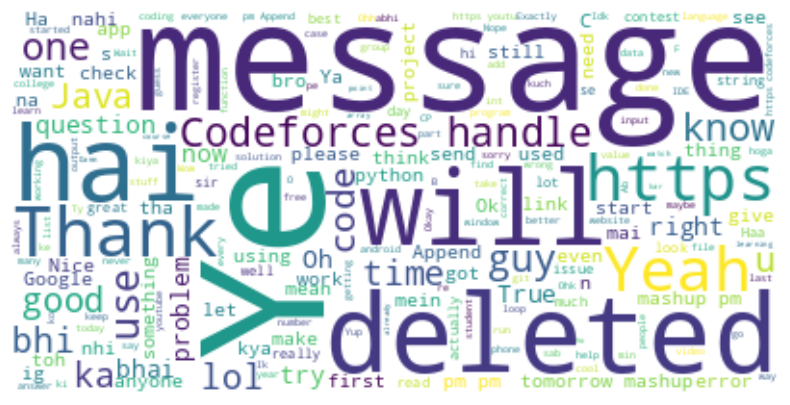

In [ ]:
text = " ".join(review for review in messages_df.Message)
print ("There are {} words in all the messages.".format(len(text)))
stopwords = set(STOPWORDS)
# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)
# Display the generated image:
# the matplotlib way:
plt.figure( figsize=(10,5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Generates and displays individual word clouds for each author in the WhatsApp chat data, visualizing their unique word usage:

Generating word cloud for: Mudita Ma'am


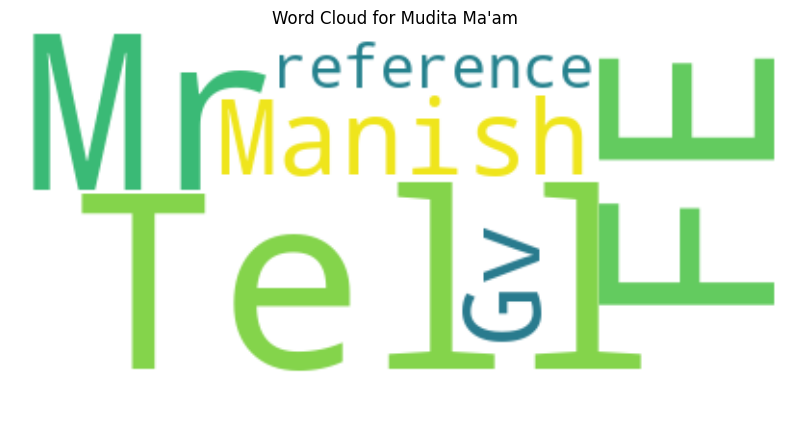

In [ ]:
# Read the data from a text file
file_path = '/content/Whatsapp_chat.txt'

# Load the data into a DataFrame
data = []
with open(file_path, 'r', encoding='utf-8') as file:
    for line in file:
        # Use regex to capture the timestamp, author, and message
        match = re.match(r'^\[(.*?)] (.*?): (.*)$', line.strip())
        if match:
            date_time, author, message = match.groups()
            data.append({'Author': author, 'Message': message})

# Check if any data was loaded
if not data:
    print("No valid messages found in the file.")
else:
    messages_df = pd.DataFrame(data)

    # Get unique authors from the messages
    authors = messages_df['Author'].unique()

    # Generate word clouds for each author
    for author in authors:
        # Filter messages for the specific author
        dummy_df = messages_df[messages_df['Author'] == author]

        if dummy_df.empty:
            print(f"No messages found for {author}.")
            continue

        # Combine all messages into a single text
        text = " ".join(review for review in dummy_df.Message)

        # Set of stopwords
        stopwords = set(STOPWORDS)

        # Generate a word cloud image
        print('Generating word cloud for:', author)
        wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

        # Display the generated image
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.title(f'Word Cloud for {author}')
        plt.show()


Sentiments_Analysis Part

Required Libraries:

In [ ]:
import re
import pandas as pd
import numpy as np
from nltk.sentiment import SentimentIntensityAnalyzer
from collections import Counter
import matplotlib.pyplot as plt
from PIL import Image
import nltk
nltk.download('vader_lexicon')

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


Extract Time:

In [ ]:
def date_time(s):
    pattern = '^([0-9]+)(\/)([0-9]+)(\/)([0-9]+), ([0-9]+):([0-9]+)[ ]?(AM|PM|am|pm)? -'
    result = re.match(pattern, s)
    return bool(result)

Find Authors or Contacts:

In [ ]:
def find_author(s):
    s = s.split(":")
    return len(s) == 2

Finding Messages:

In [ ]:
def getDatapoint(line):
    splitline = line.split(' - ')
    dateTime = splitline[0]
    date, time = dateTime.split(", ")
    message = " ".join(splitline[1:])
    if find_author(message):
        splitmessage = message.split(": ")
        author = splitmessage[0]
        message = " ".join(splitmessage[1:])
    else:
        author = None
    return date, time, author, message

Reading and parsing data:

In [ ]:
data = []
conversation = 'Whatsapp_chat.txt'
with open(conversation, encoding="utf-8") as fp:
    fp.readline()
    messageBuffer = []
    date, time, author = None, None, None
    while True:
        line = fp.readline()
        if not line:
            break
        line = line.strip()
        if date_time(line):
            if messageBuffer:
                data.append([date, time, author, ' '.join(messageBuffer)])
            messageBuffer.clear()
            date, time, author, message = getDatapoint(line)
            messageBuffer.append(message)
        else:
            messageBuffer.append(line)

Creating DataFrame:

In [ ]:
df = pd.DataFrame(data, columns=["Date", 'Time', 'Author', 'Message'])
df['Date'] = pd.to_datetime(df['Date'])
data = df.dropna()

<ipython-input-21-a7f0c0a2e89a>:2: UserWarning:

Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.



Sentiment Analysis:

In [ ]:
sid = SentimentIntensityAnalyzer()
data["Positive"] = data["Message"].apply(lambda x: sid.polarity_scores(x)["pos"])
data["Negative"] = data["Message"].apply(lambda x: sid.polarity_scores(x)["neg"])
data["Neutral"] = data["Message"].apply(lambda x: sid.polarity_scores(x)["neu"])

<ipython-input-22-8cf915a4cf1c>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-22-8cf915a4cf1c>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-22-8cf915a4cf1c>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Display Data with Sentiment Scores:

In [ ]:
print(data[['Date', 'Author', 'Message', 'Positive', 'Negative', 'Neutral']].head(10))

          Date                      Author  \
112 2020-01-27             +91 96536 93868   
113 2020-01-27             +91 96536 93868   
114 2020-01-27  Dheeraj Lalwani (TSEC, CS)   
115 2020-01-27  Dheeraj Lalwani (TSEC, CS)   
116 2020-01-27             +91 96536 93868   
117 2020-01-27  Dheeraj Lalwani (TSEC, CS)   
118 2020-01-27             +91 99201 75875   
119 2020-01-27  Dheeraj Lalwani (TSEC, CS)   
120 2020-01-27  Dheeraj Lalwani (TSEC, CS)   
121 2020-01-27             +91 95949 08570   

                                               Message  Positive  Negative  \
112                                    <Media omitted>     0.000     0.000   
113                                 Give it a try ....     0.000     0.000   
114                                            Alright     1.000     0.000   
115                           We can make this a trend     0.000     0.000   
116                                               Sure     1.000     0.000   
117                      

Summing and calculating average sentiment scores:

In [ ]:
x = data["Positive"].mean()
y = data["Negative"].mean()
z = data["Neutral"].mean()

Determining Overall Sentiment:

In [ ]:
def sentiment_score(avg_pos, avg_neg, avg_neu):
    if (avg_pos > avg_neg) and (avg_pos > avg_neu):
        return f"Overall Sentiment: Positive 😊 (Positive: {avg_pos:.2f}, Negative: {avg_neg:.2f}, Neutral: {avg_neu:.2f})"
    elif (avg_neg > avg_pos) and (avg_neg > avg_neu):
        return f"Overall Sentiment: Negative 😠 (Positive: {avg_pos:.2f}, Negative: {avg_neg:.2f}, Neutral: {avg_neu:.2f})"
    else:
        return f"Overall Sentiment: Neutral 🙂 (Positive: {avg_pos:.2f}, Negative: {avg_neg:.2f}, Neutral: {avg_neu:.2f})"

Print the final sentiment score:

In [ ]:
print(sentiment_score(x, y, z))

Overall Sentiment: Neutral 🙂 (Positive: 0.14, Negative: 0.04, Neutral: 0.78)


In [ ]:
def analyze_chat(file):
    with open(file.name, 'r', encoding='utf-8') as f:
        chat_data = f.read()

    # Split messages based on line breaks
    messages = chat_data.split('\n')

    total_messages = len(messages)
    total_links = sum(bool(re.search(r'http[s]?://', message)) for message in messages)
    total_media_files = sum('media' in message.lower() for message in messages)

    # Sentiment analysis
    positive_count = 0
    negative_count = 0
    neutral_count = 0

    for message in messages:
        analysis = TextBlob(message)
        # Classify the message sentiment
        if analysis.sentiment.polarity > 0:
            positive_count += 1
        elif analysis.sentiment.polarity < 0:
            negative_count += 1
        else:
            neutral_count += 1

    return (total_messages, total_links, total_media_files,
            positive_count, negative_count, neutral_count)

# Create a Gradio interface
interface = gr.Interface(
    fn=analyze_chat,
    inputs=gr.File(label="Upload WhatsApp Chat (text file)"),
    outputs=[
        gr.Textbox(label="Total Number of Messages"),
        gr.Textbox(label="Total Links Shared"),
        gr.Textbox(label="Total Media Files Shared"),
        gr.Textbox(label="Total Positive Messages"),
        gr.Textbox(label="Total Negative Messages"),
        gr.Textbox(label="Total Neutral Messages"),
    ],
    title="WhatsApp Chat Analyzer",
    description="Upload a WhatsApp chat text file to analyze the total messages, links shared, media files shared, and sentiment."
)

# Launch the interface
interface.launch()


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://f83cf21e0c48bc3f56.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
